# Comparisson of Antarctic Slope Current(ASC) velocities in Pan-Antarcitc simulations

This notebook aims at comparying the ASC velocities between Pan-Antarctic simulations with $0.1^o$, $0.05^o$,and $0.025^o$  horizontal resolutions. For that I will use an Along-Cross isobath coordinate system that allows comparissons regardless of the model's resolution. A sanity check with plain geographical plots will also be done.


The comparisson will use monthly ASC speeds calcualed between years 2000 and 2001 of the runs.

We will evaluate ASC mean speed, maximum speed and location 

In [1]:
import intake
import matplotlib.pyplot as plt
import numpy as np
import netCDF4 as nc
import cartopy.crs as ccrs
import xarray as xr
import cmocean as cm
import glob
import matplotlib.colors as col
import cf_xarray as cf
# need to install opencv-python for this:
import cv2
import warnings
import logging
from scipy.ndimage import distance_transform_edt
import scipy.ndimage as nd
from scipy.interpolate import griddata

logging.captureWarnings(True)
logging.getLogger('py.warnings').setLevel(logging.ERROR)

from dask.distributed import Client

figdir = '/g/data/ik11/users/wf4500/Project_panan/GH/Panan_HT_ASC/figs/'

In [2]:
client = Client(threads_per_worker = 1)

In [3]:
#importing pre-calculated ASC velocities
ASC_dirs = '/g/data/ik11/users/wf4500/Project_panan/ASC_speeds/'

P01_ASC = xr.open_mfdataset(ASC_dirs + 'Panan01/Ant_slope_current_between_isobaths*.nc').U_along.compute()
P005_ASC = xr.open_mfdataset(ASC_dirs + 'Panan005/Ant_slope_current_between_isobaths*.nc').U_along.compute()
P0025_ASC = xr.open_mfdataset(ASC_dirs + 'Panan0025/Ant_slope_current_between_isobaths*.nc').U_along.compute()



In [4]:
#Standardizing isobaths for inter-model comparisson
P01_ASC_st = P01_ASC.copy()
P01_ASC_st['x_bin'] = P0025_ASC.x_bin; P01_ASC_st['y_bin'] = P0025_ASC.y_bin

P005_ASC_st = P005_ASC.copy()
P005_ASC_st['x_bin'] = P0025_ASC.x_bin; P005_ASC_st['y_bin'] = P0025_ASC.y_bin

In [5]:
#in this definition, no frequency can be used only for static data
catalog = intake.cat.access_nri
def importer(experiment,catalog,variable, frequency = 'fx',start_time=0,end_time=0):
    warnings.filterwarnings('ignore')
    var = catalog[experiment].search(variable=variable, frequency = frequency).to_dask(xarray_open_kwargs={'decode_timedelta':True})
    if start_time!=0:
        time_slice='slice(start_time,end_time)'
        return eval("var." + variable + ".sel(time=" + time_slice + ")")
    elif start_time ==0:
        return eval("var." + variable)

In [6]:
#importing mean dzt
depth_slice=slice(0,4000)
vol_01  = xr.open_dataset('/g/data/ol01/outputs/mom6-panan/panant-01-zstar-ACCESSyr2/output000/19910101.ocean_month_z.nc').volcello.sel(z_l=depth_slice).mean('time').compute()
area_01  = importer("panant-01-zstar-ACCESSyr2",catalog,"areacello").compute()
dzt=(vol_01 /area_01).mean(('xh','yh'))


In [7]:
#Peans and standard deviations for panan01, using monthly data
P01_ASC_ymean_st = P01_ASC_st.mean('y_bin')
P01_ASC_ymean_zmean_st = P01_ASC_ymean_st.weighted(dzt).mean('z_l')
P01_ASC_ymean_st_std = P01_ASC_ymean_st.std('time')
P01_ASC_ymean_zmean_st_std = P01_ASC_ymean_zmean_st.std('time')

#Means and standard deviations for panan005, using monthly data
P005_ASC_ymean_st = P005_ASC_st.mean('y_bin')
P005_ASC_ymean_zmean_st = P005_ASC_ymean_st.weighted(dzt).mean('z_l')
P005_ASC_ymean_st_std = P005_ASC_ymean_st.std('time')
P005_ASC_ymean_zmean_st_std = P005_ASC_ymean_zmean_st.std('time')

#Means and standard deviations for panan0025, using monthly data
P0025_ASC_ymean_st = P0025_ASC.mean('y_bin')
P0025_ASC_ymean_zmean_st = P0025_ASC_ymean_st.weighted(dzt).mean('z_l')
P0025_ASC_ymean_st_std = P0025_ASC_ymean_st.std('time')
P0025_ASC_ymean_zmean_st_std = P0025_ASC_ymean_zmean_st.std('time')

In [8]:
#Extracting the strongest velocities in y too - I am calling ymax - Panan01
P01_core_loc = ((P01_ASC_st**2)**0.5).fillna(0).argmax('y_bin')
P01_core_locy = P01_ASC_st.y_bin.isel(y_bin=P01_core_loc) #location of velocity core (z,time)
P01_core_locy_zmean = P01_core_locy.weighted(dzt).mean('z_l') #location of velocity core (time)
P01_core_locy_ystd = P01_core_locy.std('time') #Standard deviation of ASC location (z)
P01_core_locy_zmean_ystd = P01_core_locy_zmean.std('time') #Standard deviation of ASC location using zmean
P01_ASC_ymax_st = P01_ASC_st.isel(y_bin = P01_core_loc )
P01_ASC_ymax_zmean_st = P01_ASC_ymax_st.weighted(dzt).mean('z_l')
P01_ASC_ymax_st_std = P01_ASC_ymax_st.std('time')
P01_ASC_ymax_zmean_st_std = P01_ASC_ymax_zmean_st.std('time')


#Extracting the strongest velocities in y too - I am calling ymax - Panan005
P005_core_loc = ((P005_ASC_st**2)**0.5).fillna(0).argmax('y_bin')
P005_core_locy = P005_ASC_st.y_bin.isel(y_bin=P005_core_loc) #location of velocity core (z,time)
P005_core_locy_zmean = P005_core_locy.weighted(dzt).mean('z_l') #location of velocity core (time)
P005_core_locy_ystd = P005_core_locy.std('time') #Standard deviation of ASC location (z)
P005_core_locy_zmean_ystd = P005_core_locy_zmean.std('time') #Standard deviation of ASC location using zmean
P005_ASC_ymax_st = P005_ASC_st.isel(y_bin = P005_core_loc )
P005_ASC_ymax_zmean_st = P005_ASC_ymax_st.weighted(dzt).mean('z_l')
P005_ASC_ymax_st_std = P005_ASC_ymax_st.std('time')
P005_ASC_ymax_zmean_st_std = P005_ASC_ymax_zmean_st.std('time')


#Extracting the strongest velocities in y too - I am calling ymax - Panan005
P0025_core_loc = ((P0025_ASC**2)**0.5).fillna(0).argmax('y_bin')
P0025_core_locy = P0025_ASC.y_bin.isel(y_bin=P0025_core_loc) #location of velocity core (z,time)
P0025_core_locy_zmean = P0025_core_locy.weighted(dzt).mean('z_l') #location of velocity core (time)
P0025_core_locy_ystd = P0025_core_locy.std('time') #Standard deviation of ASC location (z)
P0025_core_locy_zmean_ystd = P0025_core_locy_zmean.std('time') #Standard deviation of ASC location using zmean
P0025_ASC_ymax_st = P0025_ASC.isel(y_bin = P0025_core_loc )
P0025_ASC_ymax_zmean_st = P0025_ASC_ymax_st.weighted(dzt).mean('z_l')
P0025_ASC_ymax_st_std = P0025_ASC_ymax_st.std('time')
P0025_ASC_ymax_zmean_st_std = P0025_ASC_ymax_zmean_st.std('time')

In [9]:
#isobaths for visuals
Panan01_isobaths = xr.open_dataset('/home/156/wf4500/v45_wf4500/Project_panan/GH/Panan_HT_ASC/contours/Panan01_slope_coordinate_system_650mto2000m.nc')
Panan005_isobaths = xr.open_dataset('/home/156/wf4500/v45_wf4500/Project_panan/GH/Panan_HT_ASC/contours/Panan005_slope_coordinate_system_650mto2000m.nc')
Panan0025_isobaths = xr.open_dataset('/home/156/wf4500/v45_wf4500/Project_panan/GH/Panan_HT_ASC/contours/Panan0025_slope_coordinate_system_650mto2000m.nc')


In [10]:
def get_distance_from_longitude(dist_toconv, lon_targets):
    """
    Given a mapping DataArray from longitude ('xq') to distance,
    interpolate to find the distance values corresponding to specified longitudes.

    Parameters
    ----------
    dist_toconv : xr.DataArray
        DataArray mapping longitudes ('xq') to distances.
    lon_targets : array-like
        List, numpy array, or xarray DataArray of longitude values to find distances for.

    Returns
    -------
    xr.DataArray
        Interpolated distance values at the specified longitudes.
    """
    lon_targets = np.atleast_1d(lon_targets)
    return dist_toconv.interp(xq=xr.DataArray(lon_targets, dims='lon_target'))


In [11]:
dist_toconv = Panan0025_isobaths.Along_distances.mean('yq')

In [12]:
full_lon_targets=[-280,-240,-200,-160,-120,-80,-40,0,40,80]
full_distances_eqlon = get_distance_from_longitude(dist_toconv, full_lon_targets)

## I - Time mean surface along-slope velocities

In [13]:
#window for binning
bin_window=300

Text(0.5, 1.0, 'Surface velocities along isobath averaged  \n between 650 m and 1500 m isobaths, strongest in y')

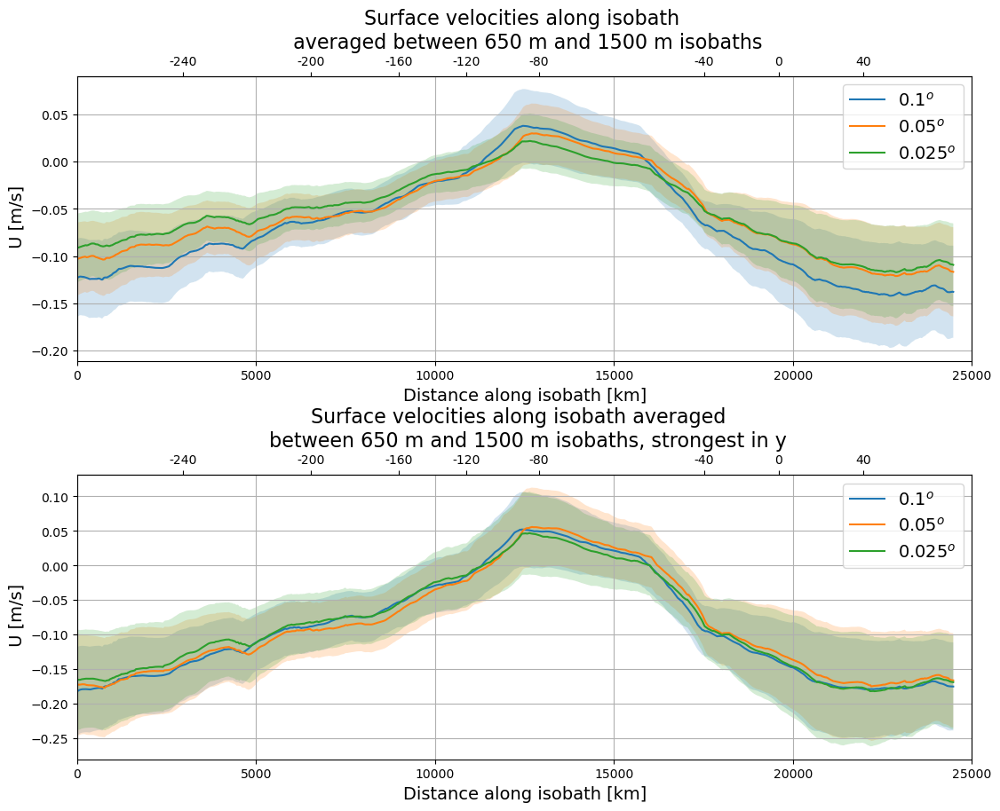

In [14]:
## plot

plt.figure(figsize=(13,10))
plt.subplots_adjust(hspace=0.4)

ax0 = plt.subplot(2,1,1)
#01, surface means
mean_surf_01_rm = P01_ASC_ymean_st.isel(z_l=0).mean('time').rolling(x_bin=bin_window,center=True,min_periods=1).mean()
std_surf_01_rm = P01_ASC_ymean_st_std.isel(z_l=0).rolling(x_bin=bin_window,center=True,min_periods=1).mean()

mean_surf_01_rm.plot(x='x_bin',label =r'$0.1^o$',color='tab:blue')
plt.fill_between(P01_ASC_ymean_st.x_bin, y1=mean_surf_01_rm-std_surf_01_rm, \
                  y2=mean_surf_01_rm+std_surf_01_rm,alpha=0.2,color='tab:blue',edgecolor='none')

#005 surface means
mean_surf_005_rm = P005_ASC_ymean_st.isel(z_l=0).mean('time').rolling(x_bin=bin_window,center=True,min_periods=1).mean()
std_surf_005_rm = P005_ASC_ymean_st_std.isel(z_l=0).rolling(x_bin=bin_window,center=True,min_periods=1).mean()

mean_surf_005_rm.plot(x='x_bin',label =r'$0.05^o$',color='tab:orange')
plt.fill_between(P005_ASC_ymean_st.x_bin, y1=mean_surf_005_rm-std_surf_005_rm, \
                  y2=mean_surf_005_rm+std_surf_005_rm,alpha=0.2,color='tab:orange',edgecolor='none')

#0025 surface means
mean_surf_0025_rm = P0025_ASC_ymean_st.isel(z_l=0).mean('time').rolling(x_bin=bin_window,center=True,min_periods=1).mean()
std_surf_0025_rm = P0025_ASC_ymean_st_std.isel(z_l=0).rolling(x_bin=bin_window,center=True,min_periods=1).mean()

mean_surf_0025_rm.plot(x='x_bin',label =r'$0.025^o$',color='tab:green')
plt.fill_between(P0025_ASC_ymean_st.x_bin, y1=mean_surf_0025_rm-std_surf_0025_rm, \
                  y2=mean_surf_0025_rm+std_surf_0025_rm,alpha=0.2,color='tab:green',edgecolor='none')

ax2_last = ax0.secondary_xaxis('top')
ax2_last.set_xticks(full_distances_eqlon)
ax2_last.set_xticklabels(full_lon_targets)

plt.xlim(0,25000)
plt.legend(fontsize=14)
plt.grid()
plt.xlabel('Distance along isobath [km]',fontsize=14)
plt.ylabel(' U [m/s]',fontsize=14)
plt.title('Surface velocities along isobath \n averaged between 650 m and 1500 m isobaths',fontsize=16)



ax1 = plt.subplot(2,1,2)
#panan01
max_surf_01_rm = P01_ASC_ymax_st.isel(z_l=0).mean('time').rolling(x_bin=bin_window,center=True,min_periods=1).mean()
stdmax_surf_01_rm = P01_ASC_ymax_st_std.isel(z_l=0).rolling(x_bin=bin_window,center=True,min_periods=1).mean()

max_surf_01_rm.plot(x='x_bin',label =r'$0.1^o$',color='tab:blue')
plt.fill_between(P01_ASC_ymean_st.x_bin, y1=max_surf_01_rm-stdmax_surf_01_rm, \
                  y2=max_surf_01_rm+stdmax_surf_01_rm,alpha=0.2,color='tab:blue',edgecolor='none')

#panan005
max_surf_005_rm = P005_ASC_ymax_st.isel(z_l=0).mean('time').rolling(x_bin=bin_window,center=True,min_periods=1).mean()
stdmax_surf_005_rm = P005_ASC_ymax_st_std.isel(z_l=0).rolling(x_bin=bin_window,center=True,min_periods=1).mean()

max_surf_005_rm.plot(x='x_bin',label =r'$0.05^o$',color='tab:orange')
plt.fill_between(P005_ASC_ymean_st.x_bin, y1=max_surf_005_rm-stdmax_surf_005_rm, \
                  y2=max_surf_005_rm+stdmax_surf_005_rm,alpha=0.2,color='tab:orange',edgecolor='none')

#panan005
max_surf_0025_rm = P0025_ASC_ymax_st.isel(z_l=0).mean('time').rolling(x_bin=bin_window,center=True,min_periods=1).mean()
stdmax_surf_0025_rm = P0025_ASC_ymax_st_std.isel(z_l=0).rolling(x_bin=bin_window,center=True,min_periods=1).mean()

max_surf_0025_rm.plot(x='x_bin',label =r'$0.025^o$',color='tab:green')
plt.fill_between(P0025_ASC_ymean_st.x_bin, y1=max_surf_0025_rm-stdmax_surf_0025_rm, \
                  y2=max_surf_0025_rm+stdmax_surf_0025_rm,alpha=0.2,color='tab:green',edgecolor='none')

ax2_last = ax1.secondary_xaxis('top')
ax2_last.set_xticks(full_distances_eqlon)
ax2_last.set_xticklabels(full_lon_targets)

plt.xlim(0,25000)
plt.legend(fontsize=14)
plt.grid()
plt.xlabel('Distance along isobath [km]',fontsize=14)
plt.ylabel(' U [m/s]',fontsize=14)
plt.title('Surface velocities along isobath averaged  \n between 650 m and 1500 m isobaths, strongest in y',fontsize=16)



#plt.savefig(figdir +'ASCmean_surface_resolutions.png',dpi=300,bbox_inches='tight')



We seem to have some sort of slowdown of mean velocities with resolution between Weddel and Prydz. This slowdown is not as strong in the strongest velocity. Placing them like this seem to mess up the locations along isobath. So lets convert to longitude for a bit more precise placing

In [15]:
#converting them to longitudes
mean_surf_01_rm_lon = mean_surf_01_rm.sel(x_bin=dist_toconv ,method='nearest')
mean_surf_005_rm_lon = mean_surf_005_rm.sel(x_bin=dist_toconv ,method='nearest')
mean_surf_0025_rm_lon = mean_surf_0025_rm.sel(x_bin=dist_toconv ,method='nearest')
std_surf_01_rm_lon = std_surf_01_rm.sel(x_bin=dist_toconv ,method='nearest')
std_surf_005_rm_lon = std_surf_005_rm.sel(x_bin=dist_toconv ,method='nearest')
std_surf_0025_rm_lon = std_surf_0025_rm.sel(x_bin=dist_toconv ,method='nearest')

Text(0.5, 1.0, 'Surface velocities along isobath \n averaged between 650 m and 1500 m isobaths')

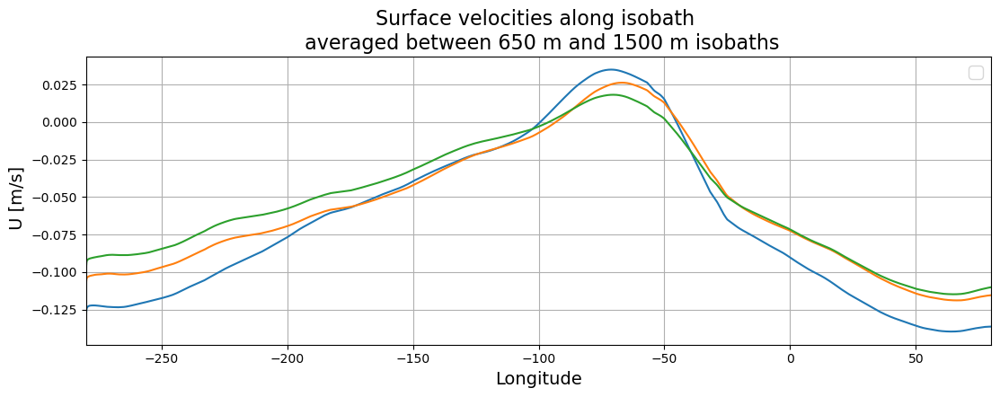

In [16]:
## plot
smoothing_longs= 1000
plt.figure(figsize=(13,10))
plt.subplots_adjust(hspace=0.4)

ax0 = plt.subplot(2,1,1)
mean_surf_01_rm_lon.rolling(xq=smoothing_longs,center=False,min_periods=1).mean().plot()
mean_surf_005_rm_lon.rolling(xq=smoothing_longs,center=False,min_periods=1).mean().plot()
mean_surf_0025_rm_lon.rolling(xq=smoothing_longs,center=False,min_periods=1).mean().plot()
plt.xlim(-280,80)
plt.legend(fontsize=14)
plt.grid()
plt.xlabel('Longitude',fontsize=14)
plt.ylabel(' U [m/s]',fontsize=14)
plt.title('Surface velocities along isobath \n averaged between 650 m and 1500 m isobaths',fontsize=16)



#### Sanity check with non-transposed surface velocities

In [17]:
#lets try first with calcualted speeds at surface
start_date='2000-01'
end_date = '2000-12'

In [18]:
%%time
#importing surface us for panan01
Us_01  = importer("panant-01-zstar-ACCESSyr2",catalog,"uo",frequency='1mon',start_time=start_date,end_time=end_date).isel(z_l=0).mean('time').compute()
Vs_01  = importer("panant-01-zstar-ACCESSyr2",catalog,"vo",frequency='1mon',start_time=start_date,end_time=end_date).isel(z_l=0).mean('time').compute()
#interpolating all to q points
Us_01_q = Us_01.interp(yh = Vs_01.yq)
Vs_01_q = Vs_01.interp(xh = Us_01.xq)

CPU times: user 5.98 s, sys: 1.77 s, total: 7.75 s
Wall time: 8.59 s


In [19]:
%%time
#importing surface us for panan005
Us_005  = importer("panant-005-zstar-ACCESSyr2",catalog,"uo",frequency='1mon',start_time=start_date,end_time=end_date).isel(z_l=0).mean('time').compute()
Vs_005  = importer("panant-005-zstar-ACCESSyr2",catalog,"vo",frequency='1mon',start_time=start_date,end_time=end_date).isel(z_l=0).mean('time').compute()
#interpolating all to q points
Us_005_q = Us_005.interp(yh = Vs_005.yq)
Vs_005_q = Vs_005.interp(xh = Us_005.xq)

CPU times: user 1min 15s, sys: 14.8 s, total: 1min 30s
Wall time: 1min 32s


In [20]:
%%time
#importing surface us for panan0025
Us_0025  = importer("panant-0025-zstar-ACCESSyr2",catalog,"uo",frequency='1mon',start_time=start_date,end_time=end_date).isel(z_l=0).mean('time').compute()
Vs_0025  = importer("panant-0025-zstar-ACCESSyr2",catalog,"vo",frequency='1mon',start_time=start_date,end_time=end_date).isel(z_l=0).mean('time').compute()
#interpolating all to q points
Us_0025_q = Us_0025.interp(yh = Vs_0025.yq)
Vs_0025_q = Vs_0025.interp(xh = Us_0025.xq)

CPU times: user 1min 55s, sys: 23.3 s, total: 2min 19s
Wall time: 2min 19s


In [21]:
#calculating surface speeds
Speed_01 = ( (Us_01_q**2) + (Vs_01_q**2) )**0.5
Speed_005 = ( (Us_005_q**2) + (Vs_005_q**2) )**0.5
Speed_0025 = ( (Us_0025_q**2) + (Vs_0025_q**2) )**0.5

In [22]:
%%time
#interpolating them to the same grid
Speed_01_on0025 = Speed_01.interp(xq=Speed_0025.xq,yq=Speed_0025.yq)
Speed_005_on0025 = Speed_005.interp(xq=Speed_0025.xq,yq=Speed_0025.yq)

CPU times: user 2.17 s, sys: 1.87 s, total: 4.04 s
Wall time: 2.58 s


Visual sanity check in different regions

#### Region 1, left of Ross Sea

In [23]:
#region 1, left of the Ross sea
R1_lon_slice = slice(-280,-200)
R1_lat_slice = slice(-70,-62)
vmaxref = 0.4
ano_scale=0.5
dist_toconv = Panan0025_isobaths.Along_distances.mean('yq')
#converting them to longitudes
mean_surf_01_rm_lon = mean_surf_01_rm.sel(x_bin=dist_toconv ,method='nearest')
mean_surf_005_rm_lon = mean_surf_005_rm.sel(x_bin=dist_toconv ,method='nearest')
mean_surf_0025_rm_lon = mean_surf_0025_rm.sel(x_bin=dist_toconv ,method='nearest')

In [24]:
panan01_1000m = np.load('/g/data/ik11/users/wf4500/Project_panan/GH/Panan_HT_ASC/contours/Antarctic_slope_contour_Panan01_1000m.npz')
ilat_range_01 = slice(0,panan01_1000m['contour_masked_above'].shape[0])
depth  = importer("panant-01-zstar-ACCESSyr2",catalog,"deptho").compute()
yh = depth.yh.isel(yh=ilat_range_01)
xh = depth.xh
depth_cut = depth.isel(yh=ilat_range_01)
xr_panan01_1000m = depth_cut.copy()
xr_panan01_1000m.values = panan01_1000m['contour_mask_numbered']
xr_panan01_1000m = xr_panan01_1000m.where(xr_panan01_1000m>0)
xr_panan01_1000m.name='1000misobath'
lon_along_isobath = xr_panan01_1000m.stack(contour=('xh','yh')).dropna(dim='contour',how='any').xh
lat_along_isobath = xr_panan01_1000m.stack(contour=('xh','yh')).dropna(dim='contour',how='any').yh
dis_along_isobath =  xr_panan01_1000m.stack(contour=('xh','yh')).dropna(dim='contour',how='any')

In [25]:
lon_targets=[-280,-260,-240,-220,-200]
distances_eqlon = get_distance_from_longitude(dist_toconv, lon_targets)
# contour_inds = [0,100,500,1000]
# for n in range(len(contour_inds)):
#     plt.text(lon_along_isobath[contour_inds[n]].values,lat_along_isobath[contour_inds[n]].values,str(np.round(dis_along_isobath[contour_inds[n]]).astype(int).values))

(0.0, 7000.0)

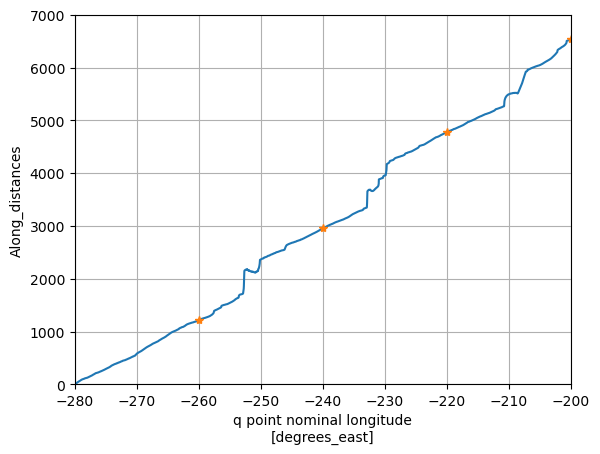

In [26]:
Panan0025_isobaths.Along_distances.mean('yq').plot()
plt.plot(lon_targets,distances_eqlon,'*')
plt.grid()
plt.xlim(-280,-200)
plt.ylim(0,7000)

In [27]:
mask_offshelf = Panan01_isobaths.Mask.bfill('yq').fillna(0)
mask_offshelf = mask_offshelf.where(mask_offshelf<1)

In [28]:
#dist_toconv 
lon_0025 = ((1+ Panan0025_isobaths.Along_distances*0) * Panan0025_isobaths.Along_distances.xq).mean('yq')
lat_0025 = ((1+ Panan0025_isobaths.Along_distances*0) * Panan0025_isobaths.Along_distances.yq).mean('yq')

(-280.0, -200.0)

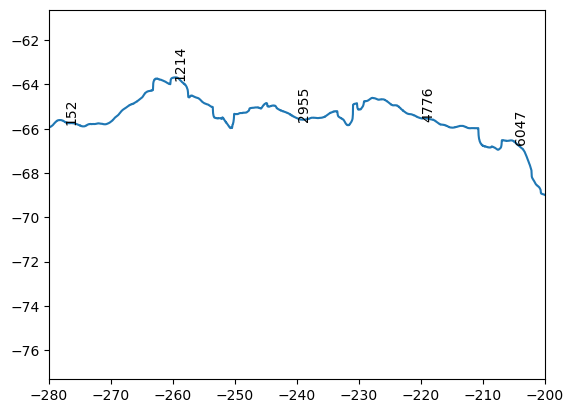

In [29]:
plt.plot(lon_0025,lat_0025)
contour_inds = [100,800,1600,2400,3000]
for n in range(len(contour_inds)):
    plt.text(lon_0025 [contour_inds[n]].values,lat_0025[contour_inds[n]].values,str(np.round(dist_toconv [contour_inds[n]]).astype(int).values),rotation=90)
plt.xlim(-280,-200)

Text(0.5, 1.0, '[d] Mean surface velocities along isobath')

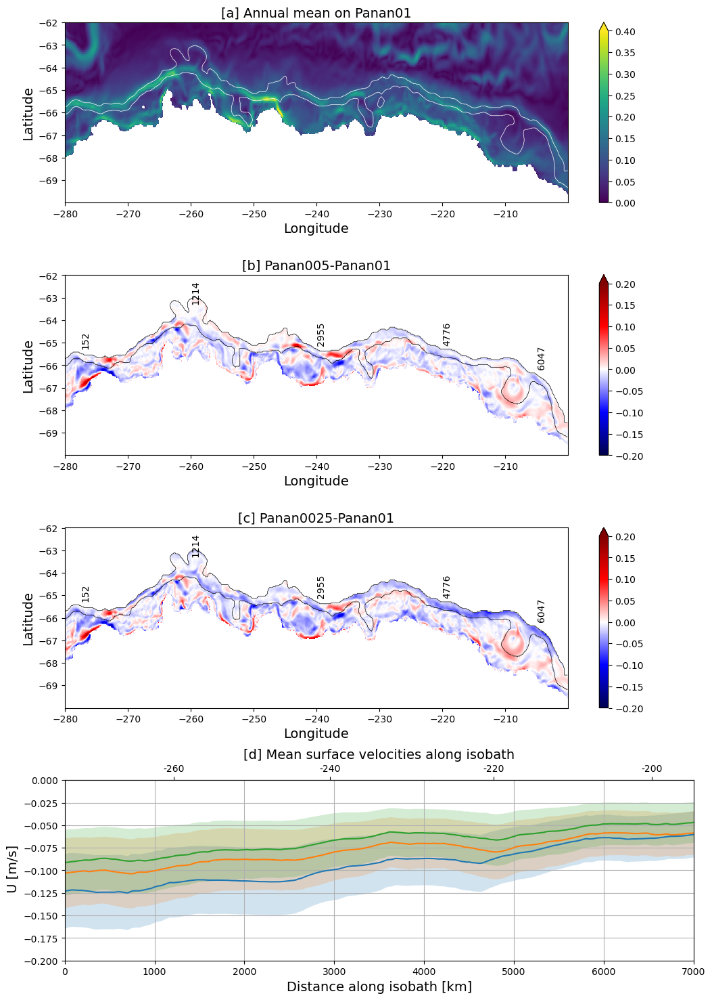

In [30]:
plt.figure(figsize=(12,18))
plt.subplots_adjust(hspace=0.4)

plt.subplot(4,1,1)
Speed_01.sel(xq=R1_lon_slice,yq=R1_lat_slice).plot(vmin=0,vmax=vmaxref)
Panan005_isobaths.sel(xq=R1_lon_slice,yq=R1_lat_slice).Mask.fillna(0)\
    .plot.contour(levels=[0,],colors='w',linewidths=0.5)
plt.xlabel('Longitude',fontsize=14)
plt.ylabel('Latitude',fontsize=14)
plt.title('[a] Annual mean on Panan01',fontsize=14)

plt.subplot(4,1,2)
(Speed_005-Speed_01_on0025).sel(xq=R1_lon_slice,yq=R1_lat_slice).plot(vmin=-vmaxref*ano_scale\
                                                                       ,vmax=vmaxref*ano_scale,cmap='seismic')
Panan01_isobaths.sel(xq=R1_lon_slice,yq=R1_lat_slice).Mask.fillna(0)\
    .plot.contour(levels=[0,],colors='k',linewidths=0.5)
mask_offshelf.sel(xq=R1_lon_slice,yq=R1_lat_slice).plot(cmap='binary',vmin=0,vmax=10,add_colorbar=False) #optional offshelf mask
contour_inds = [100,800,1600,2400,3000]
for n in range(len(contour_inds)):
    plt.text(lon_0025 [contour_inds[n]].values,0.5+lat_0025[contour_inds[n]].values,str(np.round(dist_toconv [contour_inds[n]]).astype(int).values),rotation=90)
plt.xlabel('Longitude',fontsize=14)
plt.ylabel('Latitude',fontsize=14)
plt.title('[b] Panan005-Panan01',fontsize=14)


plt.subplot(4,1,3)
(Speed_0025-Speed_01_on0025).sel(xq=R1_lon_slice,yq=R1_lat_slice).plot(vmin=-vmaxref*ano_scale\
                                                                       ,vmax=vmaxref*ano_scale,cmap='seismic')
Panan01_isobaths.sel(xq=R1_lon_slice,yq=R1_lat_slice).Mask.fillna(0)\
    .plot.contour(levels=[0,],colors='k',linewidths=0.5)
mask_offshelf.sel(xq=R1_lon_slice,yq=R1_lat_slice).plot(cmap='binary',vmin=0,vmax=10,add_colorbar=False) #optional offshelf mask
for n in range(len(contour_inds)):
    plt.text(lon_0025 [contour_inds[n]].values,0.5+lat_0025[contour_inds[n]].values,str(np.round(dist_toconv [contour_inds[n]]).astype(int).values),rotation=90)
plt.xlabel('Longitude',fontsize=14)
plt.ylabel('Latitude',fontsize=14)
plt.title('[c] Panan0025-Panan01',fontsize=14)


ax_last = plt.subplot(4,1,4)
# mean_surf_01_rm_lon.rolling(xq=smoothing_longs,center=False,min_periods=1).mean().plot(color='tab:blue')
# mean_surf_005_rm_lon.rolling(xq=smoothing_longs,center=False,min_periods=1).mean().plot(color='tab:orange')
# mean_surf_0025_rm_lon.rolling(xq=smoothing_longs,center=False,min_periods=1).mean().plot(color='tab:green')
# plt.xlim(-280,-180)
# plt.grid()
# plt.xlabel('Longitude',fontsize=14)
# plt.ylabel(' U [m/s]',fontsize=14)
# plt.title('[d] Surface velocities along isobath \n averaged between 650 m and 1500 m isobaths',fontsize=16)
# plt.ylim(-0.2,0)

#01, surface means
mean_surf_01_rm.plot(x='x_bin',label =r'$0.1^o$',color='tab:blue')
plt.fill_between(P01_ASC_ymean_st.x_bin, y1=mean_surf_01_rm-std_surf_01_rm, \
                  y2=mean_surf_01_rm+std_surf_01_rm,alpha=0.2,color='tab:blue',edgecolor='none')
mean_surf_005_rm.plot(x='x_bin',label =r'$0.05^o$',color='tab:orange')
plt.fill_between(P005_ASC_ymean_st.x_bin, y1=mean_surf_005_rm-std_surf_005_rm, \
                  y2=mean_surf_005_rm+std_surf_005_rm,alpha=0.2,color='tab:orange',edgecolor='none')
mean_surf_0025_rm.plot(x='x_bin',label =r'$0.025^o$',color='tab:green')
plt.fill_between(P0025_ASC_ymean_st.x_bin, y1=mean_surf_0025_rm-std_surf_0025_rm, \
                  y2=mean_surf_0025_rm+std_surf_0025_rm,alpha=0.2,color='tab:green',edgecolor='none')

ax2_last = ax_last.secondary_xaxis('top')
ax2_last.set_xticks(distances_eqlon)
ax2_last.set_xticklabels(lon_targets)

plt.xlim(0,7000)
plt.ylim(-0.2,0)
plt.grid()
plt.xlabel('Distance along isobath [km]',fontsize=14)
plt.ylabel(' U [m/s]',fontsize=14)
plt.title('[d] Mean surface velocities along isobath',fontsize=14)


We cab indeed see a decrease in the speed, and along-isobath velocitywith resolution in this region

#### Region 2, Ross Sea

In [31]:
#region 1, left of the Ross sea
R2_lon_slice = slice(-200,-180)
R2_lat_slice = slice(-80,-65)
vmaxref = 0.2
ano_scale=0.5

(6000.0, 8000.0)

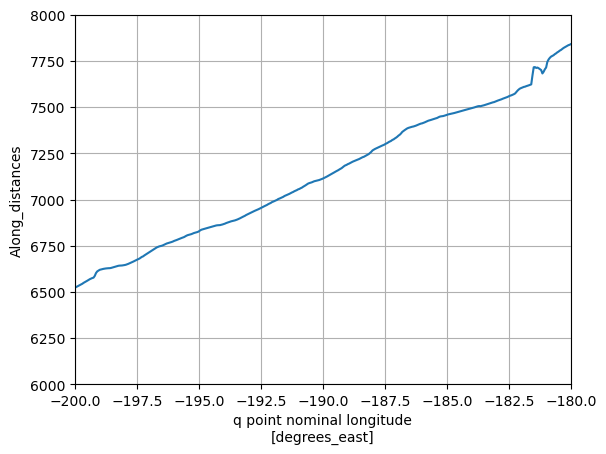

In [32]:
Panan005_isobaths.Along_distances.mean('yq').plot()
plt.grid()
plt.xlim(-200,-180)
plt.ylim(6000,8000)

In [33]:
R2_lon_targets=[-200,-190,-180]
R2_distances_eqlon = get_distance_from_longitude(dist_toconv, R2_lon_targets)

Text(0.5, 1.0, '[d] Mean surface velocities along isobath')

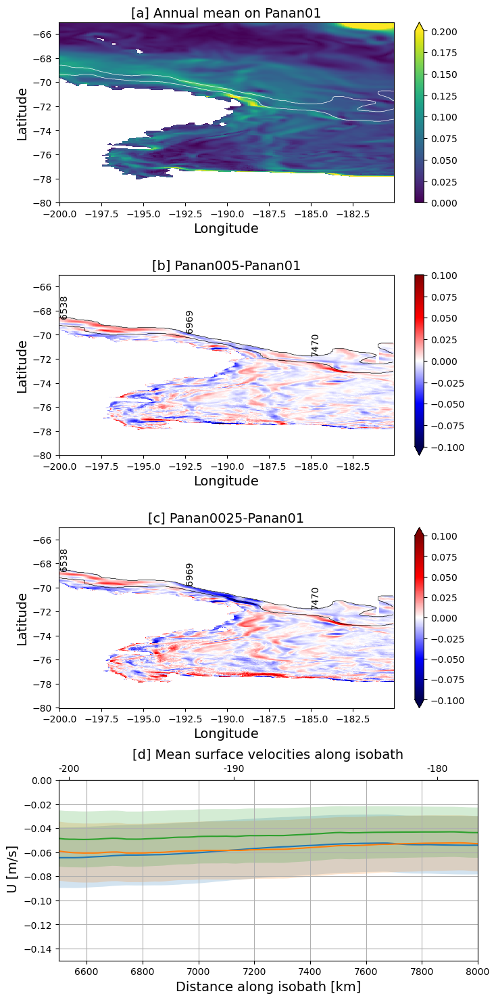

In [34]:
plt.figure(figsize=(8,18))
plt.subplots_adjust(hspace=0.4)

plt.subplot(4,1,1)
Speed_01.sel(xq=R2_lon_slice,yq=R2_lat_slice).plot(vmin=0,vmax=vmaxref)
Panan005_isobaths.sel(xq=R2_lon_slice,yq=R2_lat_slice).Mask.fillna(0)\
    .plot.contour(levels=[0,],colors='w',linewidths=0.5)
plt.xlabel('Longitude',fontsize=14)
plt.ylabel('Latitude',fontsize=14)
plt.title('[a] Annual mean on Panan01',fontsize=14)

plt.subplot(4,1,2)
(Speed_005-Speed_01_on0025).sel(xq=R2_lon_slice,yq=R2_lat_slice).plot(vmin=-vmaxref*ano_scale\
                                                                       ,vmax=vmaxref*ano_scale,cmap='seismic')
Panan01_isobaths.sel(xq=R2_lon_slice,yq=R2_lat_slice).Mask.fillna(0)\
    .plot.contour(levels=[0,],colors='k',linewidths=0.5)
mask_offshelf.sel(xq=R2_lon_slice,yq=R2_lat_slice).plot(cmap='binary',vmin=0,vmax=10,add_colorbar=False) #optional offshelf mask
contour_inds = [3200,3500,3800]
for n in range(len(contour_inds)):
    plt.text(lon_0025 [contour_inds[n]].values,0.5+lat_0025[contour_inds[n]].values,str(np.round(dist_toconv [contour_inds[n]]).astype(int).values),rotation=90)
plt.xlabel('Longitude',fontsize=14)
plt.ylabel('Latitude',fontsize=14)
plt.title('[b] Panan005-Panan01',fontsize=14)

plt.subplot(4,1,3)
(Speed_0025-Speed_01_on0025).sel(xq=R2_lon_slice,yq=R2_lat_slice).plot(vmin=-vmaxref*ano_scale\
                                                                       ,vmax=vmaxref*ano_scale,cmap='seismic')
Panan01_isobaths.sel(xq=R2_lon_slice,yq=R2_lat_slice).Mask.fillna(0)\
    .plot.contour(levels=[0,],colors='k',linewidths=0.5)
mask_offshelf.sel(xq=R2_lon_slice,yq=R2_lat_slice).plot(cmap='binary',vmin=0,vmax=10,add_colorbar=False) #optional offshelf mask
contour_inds = [3200,3500,3800]
for n in range(len(contour_inds)):
    plt.text(lon_0025 [contour_inds[n]].values,0.5+lat_0025[contour_inds[n]].values,str(np.round(dist_toconv [contour_inds[n]]).astype(int).values),rotation=90)
plt.xlabel('Longitude',fontsize=14)
plt.ylabel('Latitude',fontsize=14)
plt.title('[c] Panan0025-Panan01',fontsize=14)


ax_last = plt.subplot(4,1,4)
#01, surface means
mean_surf_01_rm.plot(x='x_bin',label =r'$0.1^o$',color='tab:blue')
plt.fill_between(P01_ASC_ymean_st.x_bin, y1=mean_surf_01_rm-std_surf_01_rm, \
                  y2=mean_surf_01_rm+std_surf_01_rm,alpha=0.2,color='tab:blue',edgecolor='none')
mean_surf_005_rm.plot(x='x_bin',label =r'$0.05^o$',color='tab:orange')
plt.fill_between(P005_ASC_ymean_st.x_bin, y1=mean_surf_005_rm-std_surf_005_rm, \
                  y2=mean_surf_005_rm+std_surf_005_rm,alpha=0.2,color='tab:orange',edgecolor='none')
mean_surf_0025_rm.plot(x='x_bin',label =r'$0.025^o$',color='tab:green')
plt.fill_between(P0025_ASC_ymean_st.x_bin, y1=mean_surf_0025_rm-std_surf_0025_rm, \
                  y2=mean_surf_0025_rm+std_surf_0025_rm,alpha=0.2,color='tab:green',edgecolor='none')

ax2_last = ax_last.secondary_xaxis('top')
ax2_last.set_xticks(R2_distances_eqlon)
ax2_last.set_xticklabels(R2_lon_targets)

plt.xlim(6500,8000)
plt.ylim(-0.15,0)
plt.grid()
plt.xlabel('Distance along isobath [km]',fontsize=14)
plt.ylabel(' U [m/s]',fontsize=14)
plt.title('[d] Mean surface velocities along isobath',fontsize=14)

# mean_surf_01_rm_lon.rolling(xq=smoothing_longs,center=False,min_periods=1).mean().plot(color='tab:blue')
# mean_surf_005_rm_lon.rolling(xq=smoothing_longs,center=False,min_periods=1).mean().plot(color='tab:orange')
# mean_surf_0025_rm_lon.rolling(xq=smoothing_longs,center=False,min_periods=1).mean().plot(color='tab:green')
# plt.xlim(-200,-175)
# plt.grid()
# plt.xlabel('Longitude',fontsize=14)
# plt.ylabel(' U [m/s]',fontsize=14)
# plt.title('[d] Surface velocities along isobath \n averaged between 650 m and 1500 m isobaths',fontsize=16)
# plt.ylim(-0.09,-0.02)


#### Region 3, Getz to Amundsen

In [35]:
#region 1, left of the Ross sea
R3_lon_slice = slice(-160,-50)
R3_lat_slice = slice(-80,-60)
vmaxref = 0.15
ano_scale=0.5

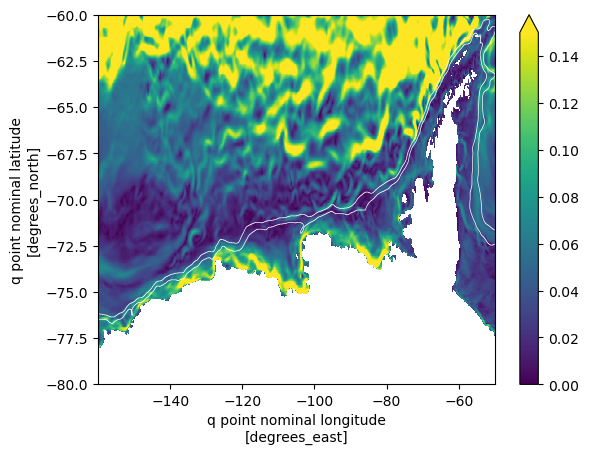

In [36]:
Speed_01.sel(xq=R3_lon_slice,yq=R3_lat_slice).plot(vmin=0,vmax=vmaxref)
Panan005_isobaths.sel(xq=R3_lon_slice,yq=R3_lat_slice).Mask.fillna(0)\
    .plot.contour(levels=[0,],colors='w',linewidths=0.5)

surface speeds are quite small on the isobath here, maybe here it is not usefull to do such an analysis

#### Region 4, Eastern Antarctic Peninsula

In [37]:
#region 4, left of the Ross sea
R4_lon_slice = slice(-60,-40)
R4_lat_slice = slice(-80,-60)
vmaxref = 0.15
ano_scale=0.5

In [38]:
R4_lon_targets=[-60,-50,-40]
R4_distances_eqlon = get_distance_from_longitude(dist_toconv, R4_lon_targets)
R4_distances_eqlon.values #i can use to constrain lastplot

array([14650.41856102, 16677.20160941, 17509.10089513])

Text(0.5, 1.0, '[d] Mean surface velocities along isobath')

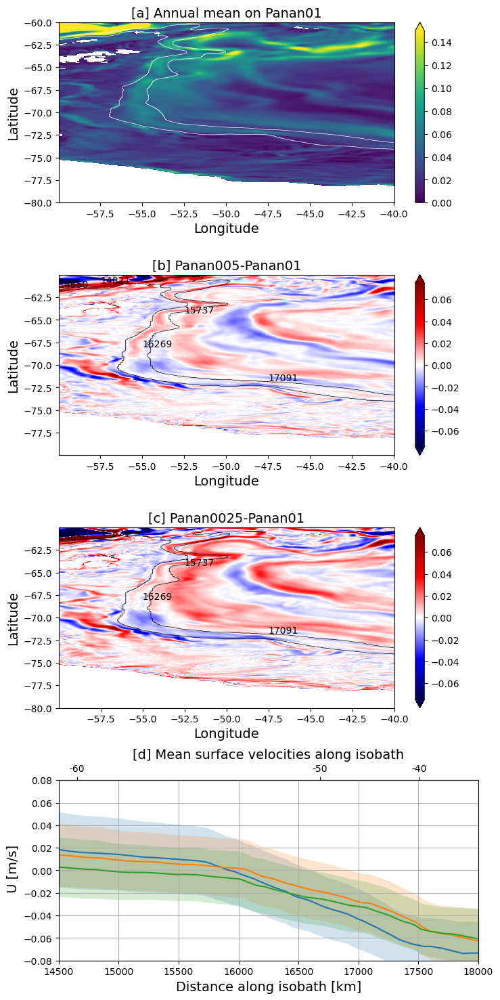

In [39]:
plt.figure(figsize=(8,18))
plt.subplots_adjust(hspace=0.4)

plt.subplot(4,1,1)
Speed_01.sel(xq=R4_lon_slice,yq=R4_lat_slice).plot(vmin=0,vmax=vmaxref)
Panan005_isobaths.sel(xq=R4_lon_slice,yq=R4_lat_slice).Mask.fillna(0)\
    .plot.contour(levels=[0,],colors='w',linewidths=0.5)
plt.xlabel('Longitude',fontsize=14)
plt.ylabel('Latitude',fontsize=14)
plt.title('[a] Annual mean on Panan01',fontsize=14)

plt.subplot(4,1,2)
(Speed_005-Speed_01_on0025).sel(xq=R4_lon_slice,yq=R4_lat_slice).plot(vmin=-vmaxref*ano_scale\
                                                                       ,vmax=vmaxref*ano_scale,cmap='seismic')
Panan01_isobaths.sel(xq=R4_lon_slice,yq=R4_lat_slice).Mask.fillna(0)\
    .plot.contour(levels=[0,],colors='k',linewidths=0.5)
#mask_offshelf.sel(xq=R4_lon_slice,yq=R4_lat_slice).plot(cmap='binary',vmin=0,vmax=10,add_colorbar=False) #optional offshelf mask
contour_inds = [8800,8900,9000,9100,9300]
for n in range(len(contour_inds)):
    plt.text(lon_0025 [contour_inds[n]].values,0.5+lat_0025[contour_inds[n]].values,str(np.round(dist_toconv [contour_inds[n]]).astype(int).values))
plt.xlabel('Longitude',fontsize=14)
plt.ylabel('Latitude',fontsize=14)
plt.title('[b] Panan005-Panan01',fontsize=14)

plt.subplot(4,1,3)
(Speed_0025-Speed_01_on0025).sel(xq=R4_lon_slice,yq=R4_lat_slice).plot(vmin=-vmaxref*ano_scale\
                                                                       ,vmax=vmaxref*ano_scale,cmap='seismic')
Panan01_isobaths.sel(xq=R4_lon_slice,yq=R4_lat_slice).Mask.fillna(0)\
    .plot.contour(levels=[0,],colors='k',linewidths=0.5)
#mask_offshelf.sel(xq=R4_lon_slice,yq=R4_lat_slice).plot(cmap='binary',vmin=0,vmax=10,add_colorbar=False) #optional offshelf mask
contour_inds = [8800,8900,9000,9100,9300]
for n in range(len(contour_inds)):
    plt.text(lon_0025 [contour_inds[n]].values,0.5+lat_0025[contour_inds[n]].values,str(np.round(dist_toconv [contour_inds[n]]).astype(int).values))
plt.xlabel('Longitude',fontsize=14)
plt.ylabel('Latitude',fontsize=14)
plt.title('[c] Panan0025-Panan01',fontsize=14)


ax_last = plt.subplot(4,1,4)
#01, surface means
mean_surf_01_rm.plot(x='x_bin',label =r'$0.1^o$',color='tab:blue')
plt.fill_between(P01_ASC_ymean_st.x_bin, y1=mean_surf_01_rm-std_surf_01_rm, \
                  y2=mean_surf_01_rm+std_surf_01_rm,alpha=0.2,color='tab:blue',edgecolor='none')
mean_surf_005_rm.plot(x='x_bin',label =r'$0.05^o$',color='tab:orange')
plt.fill_between(P005_ASC_ymean_st.x_bin, y1=mean_surf_005_rm-std_surf_005_rm, \
                  y2=mean_surf_005_rm+std_surf_005_rm,alpha=0.2,color='tab:orange',edgecolor='none')
mean_surf_0025_rm.plot(x='x_bin',label =r'$0.025^o$',color='tab:green')
plt.fill_between(P0025_ASC_ymean_st.x_bin, y1=mean_surf_0025_rm-std_surf_0025_rm, \
                  y2=mean_surf_0025_rm+std_surf_0025_rm,alpha=0.2,color='tab:green',edgecolor='none')

ax2_last = ax_last.secondary_xaxis('top')
ax2_last.set_xticks(R4_distances_eqlon)
ax2_last.set_xticklabels(R4_lon_targets)

plt.xlim(14500,18000)
plt.ylim(-0.08,0.08)
plt.grid()
plt.xlabel('Distance along isobath [km]',fontsize=14)
plt.ylabel(' U [m/s]',fontsize=14)
plt.title('[d] Mean surface velocities along isobath',fontsize=14)

# mean_surf_01_rm_lon.rolling(xq=smoothing_longs,center=False,min_periods=1).mean().plot(color='tab:blue')
# mean_surf_005_rm_lon.rolling(xq=smoothing_longs,center=False,min_periods=1).mean().plot(color='tab:orange')
# mean_surf_0025_rm_lon.rolling(xq=smoothing_longs,center=False,min_periods=1).mean().plot(color='tab:green')
# plt.xlim(-60,-35)
# plt.grid()
# plt.xlabel('Longitude',fontsize=14)
# plt.ylabel(' U [m/s]',fontsize=14)
# plt.title('[d] Surface velocities along isobath \n averaged between 650 m and 1500 m isobaths',fontsize=16)
# plt.ylim(-0.05,0.05)


#### Region 5, Weddell to Prydz

In [40]:
#region 4, left of the Ross sea
R5_lon_slice = slice(-25,80)
R5_lat_slice = slice(-74,-64)
vmaxref = 0.25
ano_scale=0.4

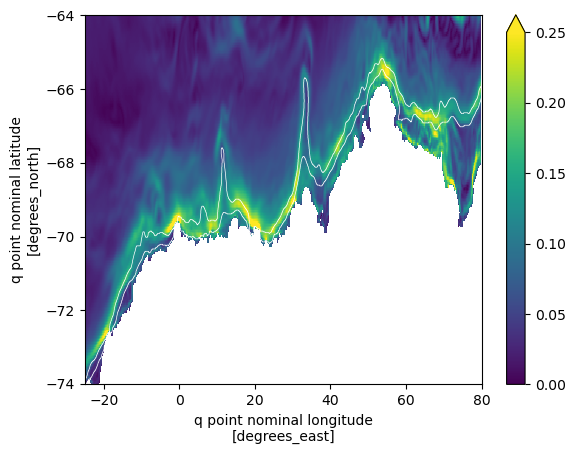

In [41]:
Speed_01.sel(xq=R5_lon_slice,yq=R5_lat_slice).plot(vmin=0,vmax=vmaxref)
Panan005_isobaths.sel(xq=R5_lon_slice,yq=R5_lat_slice).Mask.fillna(0)\
    .plot.contour(levels=[0,],colors='w',linewidths=0.5)

In [42]:
R5_lon_targets=[-20,0,20,40,60,80]
R5_distances_eqlon = get_distance_from_longitude(dist_toconv, R5_lon_targets)

Text(0.5, 1.0, '[d] Mean surface velocities along isobath')

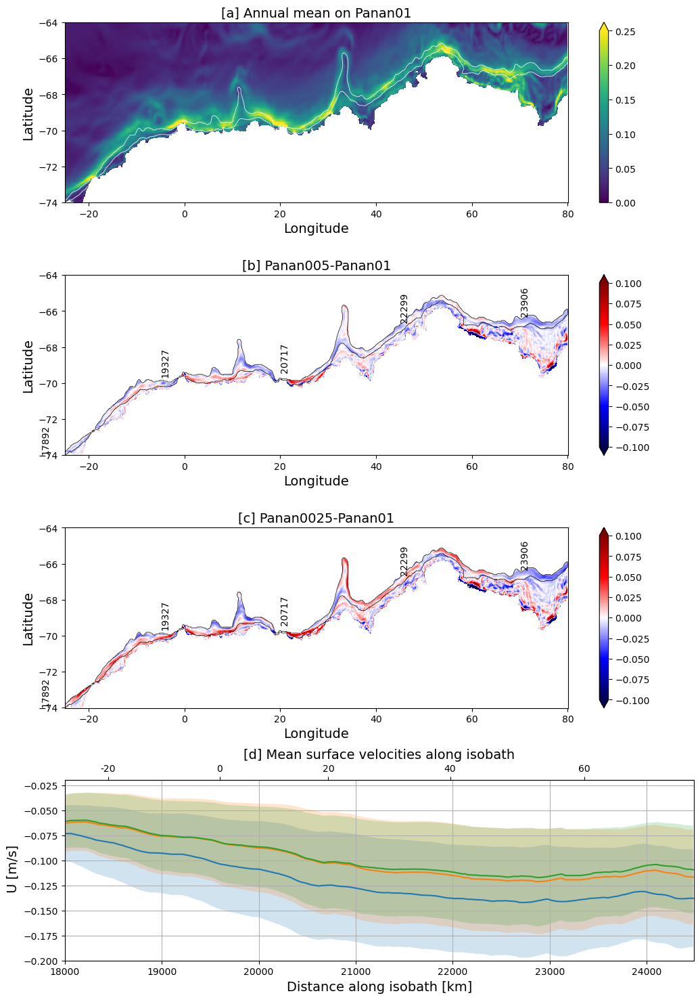

In [43]:
plt.figure(figsize=(12,18))
plt.subplots_adjust(hspace=0.4)

plt.subplot(4,1,1)
Speed_01.sel(xq=R5_lon_slice,yq=R5_lat_slice).plot(vmin=0,vmax=vmaxref)
Panan005_isobaths.sel(xq=R5_lon_slice,yq=R5_lat_slice).Mask.fillna(0)\
    .plot.contour(levels=[0,],colors='w',linewidths=0.5)
plt.xlabel('Longitude',fontsize=14)
plt.ylabel('Latitude',fontsize=14)
plt.title('[a] Annual mean on Panan01',fontsize=14)

plt.subplot(4,1,2)
(Speed_005-Speed_01_on0025).sel(xq=R5_lon_slice,yq=R5_lat_slice).plot(vmin=-vmaxref*ano_scale\
                                                                       ,vmax=vmaxref*ano_scale,cmap='seismic')
Panan01_isobaths.sel(xq=R5_lon_slice,yq=R5_lat_slice).Mask.fillna(0)\
    .plot.contour(levels=[0,],colors='k',linewidths=0.5)
mask_offshelf.sel(xq=R5_lon_slice,yq=R5_lat_slice).plot(cmap='binary',vmin=0,vmax=10,add_colorbar=False) #optional offshelf mask
contour_inds = [10000,11000,12000,13000,14000]
for n in range(len(contour_inds)):
    plt.text(lon_0025 [contour_inds[n]].values,0.5+lat_0025[contour_inds[n]].values,str(np.round(dist_toconv [contour_inds[n]]).astype(int).values),rotation=90)
plt.xlabel('Longitude',fontsize=14)
plt.ylabel('Latitude',fontsize=14)
plt.title('[b] Panan005-Panan01',fontsize=14)

plt.subplot(4,1,3)
(Speed_0025-Speed_01_on0025).sel(xq=R5_lon_slice,yq=R5_lat_slice).plot(vmin=-vmaxref*ano_scale\
                                                                       ,vmax=vmaxref*ano_scale,cmap='seismic')
Panan01_isobaths.sel(xq=R5_lon_slice,yq=R5_lat_slice).Mask.fillna(0)\
    .plot.contour(levels=[0,],colors='k',linewidths=0.5)
mask_offshelf.sel(xq=R5_lon_slice,yq=R5_lat_slice).plot(cmap='binary',vmin=0,vmax=10,add_colorbar=False) #optional offshelf mask
for n in range(len(contour_inds)):
    plt.text(lon_0025 [contour_inds[n]].values,0.5+lat_0025[contour_inds[n]].values,str(np.round(dist_toconv [contour_inds[n]]).astype(int).values),rotation=90)
plt.xlabel('Longitude',fontsize=14)
plt.ylabel('Latitude',fontsize=14)
plt.title('[c] Panan0025-Panan01',fontsize=14)


ax_last = plt.subplot(4,1,4)
#01, surface means
mean_surf_01_rm.plot(x='x_bin',label =r'$0.1^o$',color='tab:blue')
plt.fill_between(P01_ASC_ymean_st.x_bin, y1=mean_surf_01_rm-std_surf_01_rm, \
                  y2=mean_surf_01_rm+std_surf_01_rm,alpha=0.2,color='tab:blue',edgecolor='none')
mean_surf_005_rm.plot(x='x_bin',label =r'$0.05^o$',color='tab:orange')
plt.fill_between(P005_ASC_ymean_st.x_bin, y1=mean_surf_005_rm-std_surf_005_rm, \
                  y2=mean_surf_005_rm+std_surf_005_rm,alpha=0.2,color='tab:orange',edgecolor='none')
mean_surf_0025_rm.plot(x='x_bin',label =r'$0.025^o$',color='tab:green')
plt.fill_between(P0025_ASC_ymean_st.x_bin, y1=mean_surf_0025_rm-std_surf_0025_rm, \
                  y2=mean_surf_0025_rm+std_surf_0025_rm,alpha=0.2,color='tab:green',edgecolor='none')

ax2_last = ax_last.secondary_xaxis('top')
ax2_last.set_xticks(R5_distances_eqlon)
ax2_last.set_xticklabels(R5_lon_targets)

plt.xlim(18000,24485)
plt.ylim(-0.2,-0.02)
plt.grid()
plt.xlabel('Distance along isobath [km]',fontsize=14)
plt.ylabel(' U [m/s]',fontsize=14)
plt.title('[d] Mean surface velocities along isobath',fontsize=14)

# mean_surf_01_rm_lon.rolling(xq=smoothing_longs,center=False,min_periods=1).mean().plot(color='tab:blue')
# mean_surf_005_rm_lon.rolling(xq=smoothing_longs,center=False,min_periods=1).mean().plot(color='tab:orange')
# mean_surf_0025_rm_lon.rolling(xq=smoothing_longs,center=False,min_periods=1).mean().plot(color='tab:green')
# plt.xlim(-60,-35)
# plt.grid()
# plt.xlabel('Longitude',fontsize=14)
# plt.ylabel(' U [m/s]',fontsize=14)
# plt.title('[d] Surface velocities along isobath \n averaged between 650 m and 1500 m isobaths',fontsize=16)
# plt.ylim(-0.05,0.05)


### Circumpolar mean of ASC speed, sanity check

In [44]:
P01_tranpo = xr.open_dataset('/home/156/wf4500/v45_wf4500/Project_panan/GH/Panan_HT_ASC/contours/Panan01_slope_coordinate_system_650mto2000m.nc')
P005_tranpo = xr.open_dataset('/home/156/wf4500/v45_wf4500/Project_panan/GH/Panan_HT_ASC/contours/Panan005_slope_coordinate_system_650mto2000m.nc')
P0025_tranpo = xr.open_dataset('/home/156/wf4500/v45_wf4500/Project_panan/GH/Panan_HT_ASC/contours/Panan0025_slope_coordinate_system_650mto2000m.nc')

In [45]:
#along slope velocities
P01_Ualong_ug = (Us_01_q *P01_tranpo.dhu_dy/P01_tranpo.slope) - (Vs_01_q*P01_tranpo.dhu_dx/P01_tranpo.slope) * P01_tranpo.Mask
P005_Ualong_ug = (Us_005_q *P005_tranpo.dhu_dy/P005_tranpo.slope) - (Vs_005_q*P005_tranpo.dhu_dx/P005_tranpo.slope) * P005_tranpo.Mask
P0025_Ualong_ug = (Us_0025_q *P0025_tranpo.dhu_dy/P0025_tranpo.slope) - (Vs_0025_q*P0025_tranpo.dhu_dx/P0025_tranpo.slope) * P0025_tranpo.Mask

In [46]:
P01_Ualong_ug_speed = (P01_Ualong_ug**2)**0.5
P005_Ualong_ug_speed = (P005_Ualong_ug**2)**0.5
P0025_Ualong_ug_speed = (P0025_Ualong_ug**2)**0.5

In [47]:
#interpolating into 0025 grid - Speed
P01_Ualong_ug_speed_on0025 = P01_Ualong_ug_speed.interp(xq=P0025_Ualong_ug.xq,yq=P0025_Ualong_ug.yq)
P005_Ualong_ug_speed_on0025 = P005_Ualong_ug_speed.interp(xq=P0025_Ualong_ug.xq,yq=P0025_Ualong_ug.yq)

In [48]:
#interpolating into 0025 grid - velocities
P01_Ualong_ug_on0025 = P01_Ualong_ug.interp(xq=P0025_Ualong_ug.xq,yq=P0025_Ualong_ug.yq)
P005_Ualong_ug_on0025 = P005_Ualong_ug.interp(xq=P0025_Ualong_ug.xq,yq=P0025_Ualong_ug.yq)

(-77.0, -60.0)

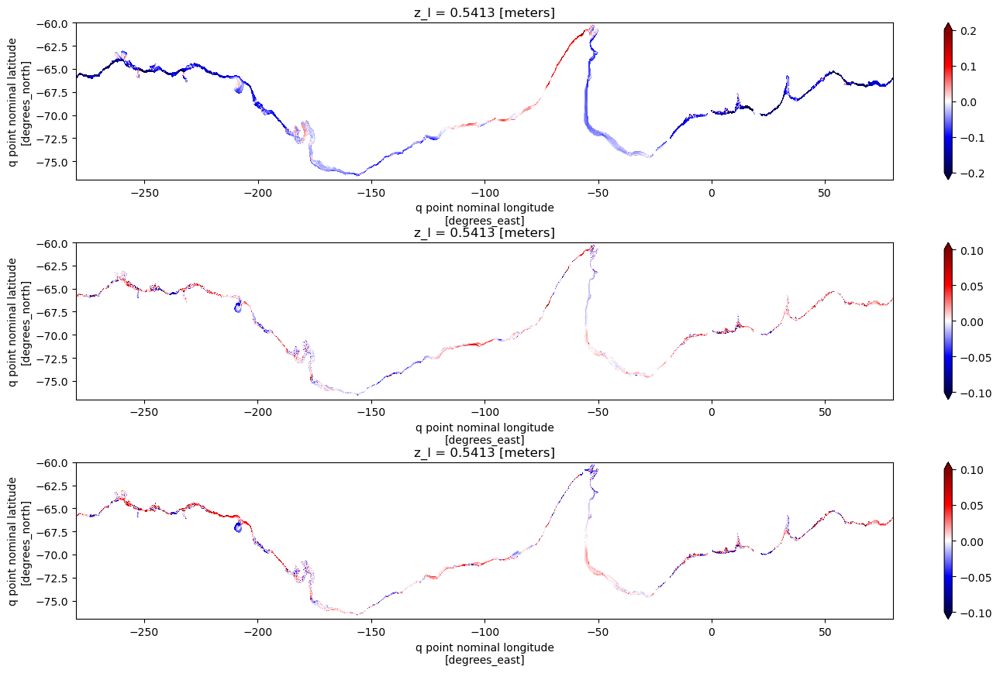

In [49]:
plt.figure(figsize=(17,10))
plt.subplots_adjust(hspace=0.4)

plt.subplot(3,1,1)
P01_Ualong_ug.plot(cmap='seismic',vmin=-.2,vmax=.2)
plt.ylim(-77,-60)

plt.subplot(3,1,2)
(P005_Ualong_ug_on0025 - P01_Ualong_ug_on0025 ).plot(cmap='seismic',vmin=-.1,vmax=.1)
plt.ylim(-77,-60)

plt.subplot(3,1,3)
(P0025_Ualong_ug - P01_Ualong_ug_on0025 ).plot(cmap='seismic',vmin=-.1,vmax=.1)
plt.ylim(-77,-60)

In [50]:
#means
P01_Ualong_longs = P01_Ualong_ug.mean('yq').interpolate_na('xq')
P005_Ualong_longs = P005_Ualong_ug.mean('yq').interpolate_na('xq')
P0025_Ualong_longs = P0025_Ualong_ug.mean('yq').interpolate_na('xq')


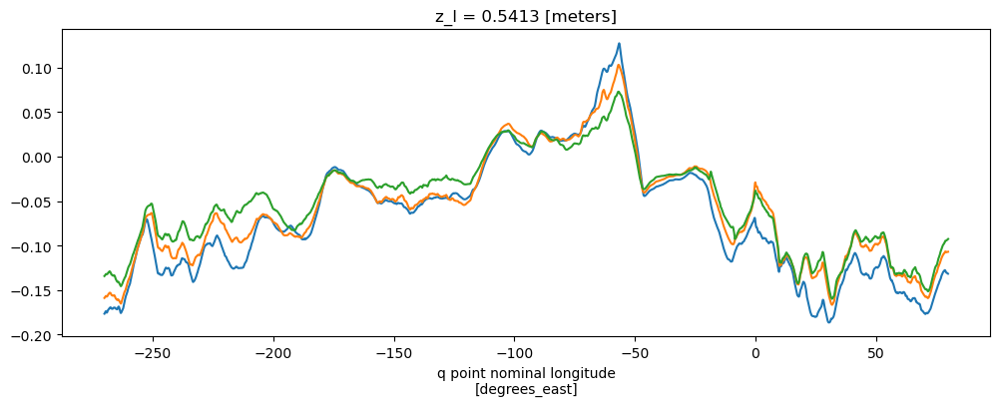

In [51]:
plt.figure(figsize=(12,4))
P01_Ualong_longs.rolling(xq=100).mean().plot()
P005_Ualong_longs.rolling(xq=200).mean().plot()
P0025_Ualong_longs.rolling(xq=400).mean().plot()

## II - Timemean water column integrated ASC velocities

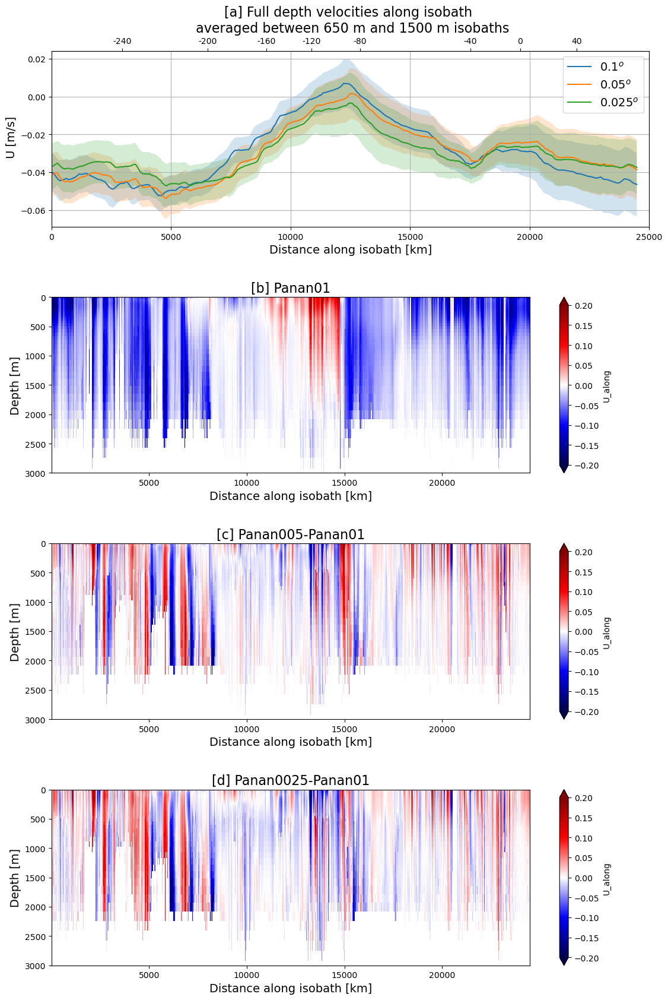

In [52]:
# plot

plt.figure(figsize=(13,20))
plt.subplots_adjust(hspace=0.4)

ax0 = plt.subplot(4,1,1)
#01, surface means
mean_surf_01_rm = P01_ASC_ymean_st.weighted(dzt).mean('z_l').mean('time').rolling(x_bin=bin_window,center=True,min_periods=1).mean()
std_surf_01_rm =  P01_ASC_ymean_st.weighted(dzt).mean('z_l').std('time').rolling(x_bin=bin_window,center=True,min_periods=1).mean()

mean_surf_01_rm.plot(x='x_bin',label =r'$0.1^o$',color='tab:blue')
plt.fill_between(P01_ASC_ymean_st.x_bin, y1=mean_surf_01_rm-std_surf_01_rm, \
                  y2=mean_surf_01_rm+std_surf_01_rm,alpha=0.2,color='tab:blue',edgecolor='none')

#005 surface means
mean_surf_005_rm = P005_ASC_ymean_st.weighted(dzt).mean('z_l').mean('time').rolling(x_bin=bin_window,center=True,min_periods=1).mean()
std_surf_005_rm = P005_ASC_ymean_st.weighted(dzt).mean('z_l').std('time').rolling(x_bin=bin_window,center=True,min_periods=1).mean()

mean_surf_005_rm.plot(x='x_bin',label =r'$0.05^o$',color='tab:orange')
plt.fill_between(P005_ASC_ymean_st.x_bin, y1=mean_surf_005_rm-std_surf_005_rm, \
                  y2=mean_surf_005_rm+std_surf_005_rm,alpha=0.2,color='tab:orange',edgecolor='none')

#0025 surface means
mean_surf_0025_rm = P0025_ASC_ymean_st.weighted(dzt).mean('z_l').mean('time').rolling(x_bin=bin_window,center=True,min_periods=1).mean()
std_surf_0025_rm = P0025_ASC_ymean_st.weighted(dzt).mean('z_l').std('time').rolling(x_bin=bin_window,center=True,min_periods=1).mean()

mean_surf_0025_rm.plot(x='x_bin',label =r'$0.025^o$',color='tab:green')
plt.fill_between(P0025_ASC_ymean_st.x_bin, y1=mean_surf_0025_rm-std_surf_0025_rm, \
                  y2=mean_surf_0025_rm+std_surf_0025_rm,alpha=0.2,color='tab:green',edgecolor='none')

ax2_last = ax0.secondary_xaxis('top')
ax2_last.set_xticks(full_distances_eqlon)
ax2_last.set_xticklabels(full_lon_targets)

plt.xlim(0,25000)
plt.legend(fontsize=14)
plt.grid()
plt.xlabel('Distance along isobath [km]',fontsize=14)
plt.ylabel(' U [m/s]',fontsize=14)
plt.title('[a] Full depth velocities along isobath \n averaged between 650 m and 1500 m isobaths',fontsize=16)


# #panan01
ax1 = plt.subplot(4,1,2)
mean_fz_01_rm = P01_ASC_ymean_st.mean('time')#.rolling(x_bin=bin_window,center=True,min_periods=1).mean()
mean_fz_01_rm .plot(x='x_bin',vmin=-.2,vmax=.2,cmap='seismic')
plt.ylim(3000,0)
plt.xlabel('Distance along isobath [km]',fontsize=14)
plt.ylabel('Depth [m]',fontsize=14)
plt.title('[b] Panan01',fontsize=16)

# #panan005-panan01
ax1 = plt.subplot(4,1,3)
mean_fz_005_rm = P005_ASC_ymean_st.mean('time')#.rolling(x_bin=bin_window,center=True,min_periods=1).mean()
(mean_fz_005_rm- mean_fz_01_rm) .plot(x='x_bin',vmin=-.2,vmax=.2,cmap='seismic')
plt.ylim(3000,0)
plt.xlabel('Distance along isobath [km]',fontsize=14)
plt.ylabel('Depth [m]',fontsize=14)
plt.title('[c] Panan005-Panan01',fontsize=16)


# #panan005-panan01
ax1 = plt.subplot(4,1,4)
mean_fz_0025_rm = P0025_ASC_ymean_st.mean('time')#.rolling(x_bin=bin_window,center=True,min_periods=1).mean()
(mean_fz_0025_rm- mean_fz_01_rm) .plot(x='x_bin',vmin=-.2,vmax=.2,cmap='seismic')
plt.ylim(3000,0)
plt.xlabel('Distance along isobath [km]',fontsize=14)
plt.ylabel('Depth [m]',fontsize=14)
plt.title('[d] Panan0025-Panan01',fontsize=16)


plt.savefig(figdir +'ASCmean_z_resolutions.png',dpi=300,bbox_inches='tight')



Here the signal is a not that clean when we see that water column integrated. Weddell-to-Prydz region seem to slowdown, while Ross-to-Weddell to speed up a bit.

The plot(z) shows the ASC slowdown a bit cleaner tho


## III - Spatial mean, timeseries comparisson

In [53]:
#calculating spatial means - 01
P01_ASC_surf = P01_ASC.mean('y_bin').mean('x_bin').isel(z_l=0)
P01_ASC_z = P01_ASC.mean('y_bin').mean('x_bin').weighted(dzt).mean('z_l')


#calculating spatial means - 005
P005_ASC_surf = P005_ASC.mean('y_bin').mean('x_bin').isel(z_l=0)
P005_ASC_z = P005_ASC.mean('y_bin').mean('x_bin').weighted(dzt).mean('z_l')

#calculating spatial means - 0025
P0025_ASC_surf = P0025_ASC.mean('y_bin').mean('x_bin').isel(z_l=0)
P0025_ASC_z = P0025_ASC.mean('y_bin').mean('x_bin').weighted(dzt).mean('z_l')

Text(0.5, 1.0, '[b] Full depth ASC velocities')

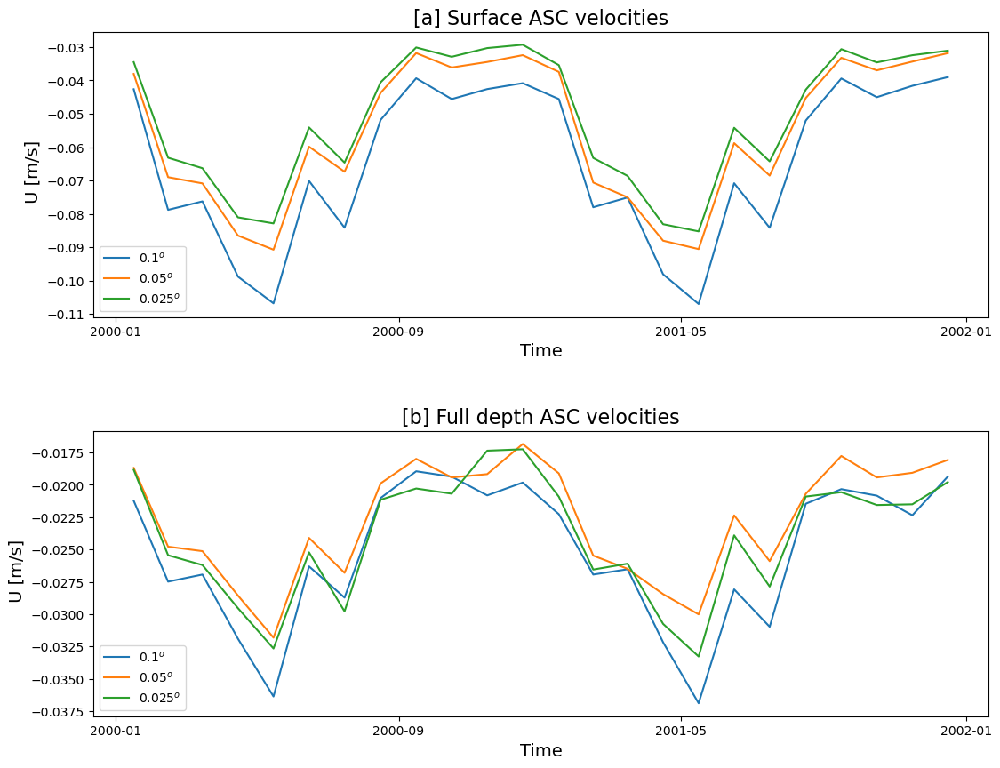

In [54]:
plt.figure(figsize=(13,10))
plt.subplots_adjust(hspace=0.4)

ax0 = plt.subplot(2,1,1)
P01_ASC_surf.plot(label=r'$0.1^o$')
P005_ASC_surf.plot(label=r'$0.05^o$')
P0025_ASC_surf.plot(label=r'$0.025^o$')
plt.legend()
plt.xlabel('Time',fontsize=14)
plt.ylabel(' U [m/s]',fontsize=14)
plt.title('[a] Surface ASC velocities',fontsize=16)

ax1 = plt.subplot(2,1,2)
P01_ASC_z.plot(label=r'$0.1^o$')
P005_ASC_z.plot(label=r'$0.05^o$')
P0025_ASC_z.plot(label=r'$0.025^o$')
plt.legend()
plt.xlabel('Time',fontsize=14)
plt.ylabel(' U [m/s]',fontsize=14)
plt.title('[b] Full depth ASC velocities',fontsize=16)

Ill help with registration
8:30 am start, and well try to gather people for the microphone duties
1:30 pm on Thursday we can check in (whatever that means)

## Visual check on speeds

It could happen that ASC is not located in the same place in different resolutions, or the jet could have narrowed or expanded. It is worth doing a visua check to see wether this happens

**Cell below takes a very long time to run**

In [64]:
%%time
#calculating full depth speed means
#importing surface us for panan01
Us_01_FD  = importer("panant-01-zstar-ACCESSyr2",catalog,"uo",frequency='1mon',start_time=start_date,end_time=end_date).sel(z_l=depth_slice).weighted(dzt).mean('z_l').mean('time').compute()
Vs_01_FD  = importer("panant-01-zstar-ACCESSyr2",catalog,"vo",frequency='1mon',start_time=start_date,end_time=end_date).sel(z_l=depth_slice).weighted(dzt).mean('z_l').mean('time').compute()
#interpolating all to q points
Us_01_FD_q = Us_01_FD.interp(yh = Vs_01_FD.yq)
Vs_01_FD_q = Vs_01_FD.interp(xh = Us_01_FD.xq)

#importing surface us for panan005
Us_005_FD  = importer("panant-005-zstar-ACCESSyr2",catalog,"uo",frequency='1mon',start_time=start_date,end_time=end_date).sel(z_l=depth_slice).weighted(dzt).mean('z_l').mean('time').compute()
Vs_005_FD  = importer("panant-005-zstar-ACCESSyr2",catalog,"vo",frequency='1mon',start_time=start_date,end_time=end_date).sel(z_l=depth_slice).weighted(dzt).mean('z_l').mean('time').compute()
#interpolating all to q points
Us_005_FD_q = Us_005_FD.interp(yh = Vs_005_FD.yq)
Vs_005_FD_q = Vs_005_FD.interp(xh = Us_005_FD.xq)

Us_0025_FD  = importer("panant-0025-zstar-ACCESSyr2",catalog,"uo",frequency='1mon',start_time=start_date,end_time=end_date).sel(z_l=depth_slice).weighted(dzt).mean('z_l').mean('time').compute()
Vs_0025_FD  = importer("panant-0025-zstar-ACCESSyr2",catalog,"vo",frequency='1mon',start_time=start_date,end_time=end_date).sel(z_l=depth_slice).weighted(dzt).mean('z_l').mean('time').compute()
#interpolating all to q points
Us_0025_FD_q = Us_0025_FD.interp(yh = Vs_0025_FD.yq)
Vs_0025_FD_q = Vs_0025_FD.interp(xh = Us_0025_FD.xq)

#calculating surface speeds
Speed_01_FD = ( (Us_01_FD_q**2) + (Vs_01_FD_q**2) )**0.5
Speed_005_FD = ( (Us_005_FD_q**2) + (Vs_005_FD_q**2) )**0.5
Speed_0025_FD = ( (Us_0025_FD_q**2) + (Vs_0025_FD_q**2) )**0.5

CPU times: user 31min 47s, sys: 5min 30s, total: 37min 17s
Wall time: 37min 23s


In [402]:
Speed_masked_01_into0025 = (Speed_01* Panan01_isobaths.Mask).interp(xq=Speed_0025.xq,yq=Speed_0025.yq)
Speed_masked_005_into0025 = (Speed_005* Panan005_isobaths.Mask).interp(xq=Speed_0025.xq,yq=Speed_0025.yq)
Speed_masked_0025 = (Speed_0025* Panan0025_isobaths.Mask)

Speed_masked_01_FD_into0025 = (Speed_01_FD* Panan01_isobaths.Mask).interp(xq=Speed_0025_FD.xq,yq=Speed_0025_FD.yq)
Speed_masked_005_FD_into0025 = (Speed_005_FD* Panan005_isobaths.Mask).interp(xq=Speed_0025_FD.xq,yq=Speed_0025_FD.yq)
Speed_masked_0025_FD = (Speed_0025_FD* Panan0025_isobaths.Mask)

In [ ]:
#calculating along-slope speed in each run
P01_alongiso_speed = (P01_ASC**2)**0.5
P005_alongiso_speed = (P005_ASC**2)**0.5
P0025_alongiso_speed = (P0025_ASC**2)**0.5

#time average
P01_alongiso_speed_tmean = P01_alongiso_speed.mean('time')
P005_alongiso_speed_tmean = P005_alongiso_speed.mean('time')
P0025_alongiso_speed_tmean = P0025_alongiso_speed.mean('time')

# Normalized by max - will be used to find the 50% of maximum and others
P01_alongiso_speed_tmean_norm = (P01_alongiso_speed_tmean/P01_alongiso_speed_tmean.max('y_bin')).fillna(0)
P005_alongiso_speed_tmean_norm = (P005_alongiso_speed_tmean/P005_alongiso_speed_tmean.max('y_bin')).fillna(0)
P0025_alongiso_speed_tmean_norm = (P0025_alongiso_speed_tmean/P0025_alongiso_speed_tmean.max('y_bin')).fillna(0)

# getting the y_bin with maximum speeds
P01_alongiso_speed_tmean_ymax = P01_alongiso_speed_tmean.y_bin.isel(y_bin = P01_alongiso_speed_tmean.fillna(0).argmax('y_bin'))
P005_alongiso_speed_tmean_ymax = P005_alongiso_speed_tmean.y_bin.isel(y_bin = P005_alongiso_speed_tmean.fillna(0).argmax('y_bin'))
P0025_alongiso_speed_tmean_ymax = P0025_alongiso_speed_tmean.y_bin.isel(y_bin = P0025_alongiso_speed_tmean.fillna(0).argmax('y_bin'))


# doing a rolling mean for visualization
factor=8e-2
P01_alongiso_speed_tmean_ymax_rmean = P01_alongiso_speed_tmean_ymax.rolling(x_bin=int(bin_window*factor),center=True,min_periods=1).mean()
P005_alongiso_speed_tmean_ymax_rmean = P005_alongiso_speed_tmean_ymax.rolling(x_bin=int(bin_window*factor),center=True,min_periods=1).mean()
P0025_alongiso_speed_tmean_ymax_rmean = P0025_alongiso_speed_tmean_ymax.rolling(x_bin=int(bin_window*factor),center=True,min_periods=1).mean()

# getting the y_bin with X% of maximum
xperc=0.5
P01_alongiso_speed_tmean_50ymax = (P01_alongiso_speed_tmean_norm.where(P01_alongiso_speed_tmean_norm<xperc,P01_alongiso_speed_tmean_norm-1)).argmax('y_bin')
P01_alongiso_speed_tmean_50ymax = P01_alongiso_speed_tmean_norm.y_bin.isel(y_bin = P01_alongiso_speed_tmean_50ymax)
P005_alongiso_speed_tmean_50ymax = (P005_alongiso_speed_tmean_norm.where(P005_alongiso_speed_tmean_norm<xperc,P005_alongiso_speed_tmean_norm-1)).argmax('y_bin')
P005_alongiso_speed_tmean_50ymax = P005_alongiso_speed_tmean.y_bin.isel(y_bin = P005_alongiso_speed_tmean_50ymax)
P0025_alongiso_speed_tmean_50ymax = (P0025_alongiso_speed_tmean_norm.where(P0025_alongiso_speed_tmean_norm<xperc,P0025_alongiso_speed_tmean_norm-1)).argmax('y_bin')
P0025_alongiso_speed_tmean_50ymax = P0025_alongiso_speed_tmean.y_bin.isel(y_bin = P0025_alongiso_speed_tmean_50ymax)


# doing a rolling mean for visualization
P01_alongiso_speed_tmean_50ymax_rmean = P01_alongiso_speed_tmean_50ymax.rolling(x_bin=int(bin_window*factor),center=True,min_periods=1).mean()
P005_alongiso_speed_tmean_50ymax_rmean = P005_alongiso_speed_tmean_50ymax.rolling(x_bin=int(bin_window*factor),center=True,min_periods=1).mean()
P0025_alongiso_speed_tmean_50ymax_rmean = P0025_alongiso_speed_tmean_50ymax.rolling(x_bin=int(bin_window*factor),center=True,min_periods=1).mean()

#distance from the mean location
P01_alongiso_speed_tmean_50ymax_rmean_dist = ((P01_alongiso_speed_tmean_50ymax_rmean - P01_alongiso_speed_tmean_ymax_rmean)**2)**0.5
P005_alongiso_speed_tmean_50ymax_rmean_dist = ((P005_alongiso_speed_tmean_50ymax_rmean - P005_alongiso_speed_tmean_ymax_rmean)**2)**0.5
P0025_alongiso_speed_tmean_50ymax_rmean_dist = ((P0025_alongiso_speed_tmean_50ymax_rmean - P0025_alongiso_speed_tmean_ymax_rmean)**2)**0.5


#distances conversors
dist_toconv0025 = Panan0025_isobaths.Along_distances.mean('yq')
dist_toconv005 = Panan005_isobaths.Along_distances.mean('yq')
dist_toconv01 = Panan01_isobaths.Along_distances.mean('yq')

#converting them to longitudes
P01_alongiso_speed_tmean_50ymax_rmean_dist_lon = P01_alongiso_speed_tmean_50ymax_rmean_dist.sel(x_bin=dist_toconv01 ,method='nearest')
P005_alongiso_speed_tmean_50ymax_rmean_dist_lon = P005_alongiso_speed_tmean_50ymax_rmean_dist.sel(x_bin=dist_toconv005 ,method='nearest')
P0025_alongiso_speed_tmean_50ymax_rmean_dist_lon = P0025_alongiso_speed_tmean_50ymax_rmean_dist.sel(x_bin=dist_toconv0025 ,method='nearest')


###  Western Ross sea

In [412]:
from xhistogram.xarray import histogram

(0.0, 0.3)

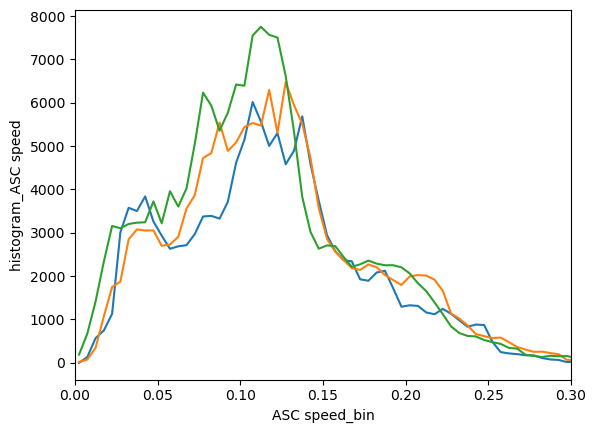

In [452]:
ASC_bins=np.linspace(0,.5,101)
Speed_masked_01_into0025.name= 'ASC speed'
speed01_histogram = histogram(Speed_masked_01_into0025.sel(xq=slice(-280,-200)),bins=ASC_bins, dim=['yq'])
Speed_masked_005_into0025.name= 'ASC speed'
speed005_histogram = histogram(Speed_masked_005_into0025.sel(xq=slice(-280,-200)),bins=ASC_bins, dim=['yq'])
Speed_masked_0025.name= 'ASC speed'
speed0025_histogram = histogram(Speed_masked_0025.sel(xq=slice(-280,-200)),bins=ASC_bins, dim=['yq'])



speed01_histogram.sum('xq').plot()
speed005_histogram.sum('xq').plot()
speed0025_histogram.sum('xq').plot()
plt.xlim(0,0.3)

(0.0, 0.3)

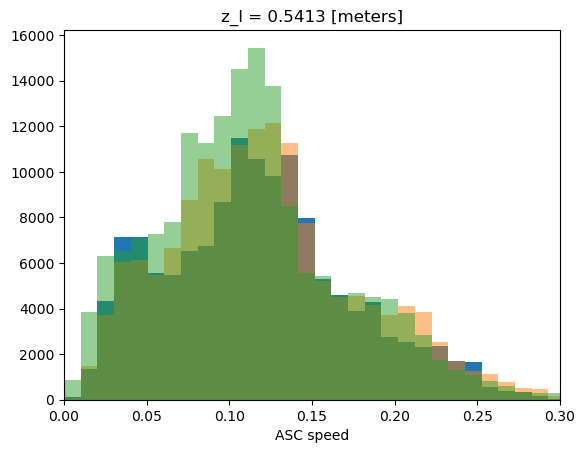

In [451]:
ASC_bins=np.linspace(0,1,100)

Speed_masked_01_into0025.sel(xq=slice(-280,-200)).plot.hist(bins=ASC_bins)
Speed_masked_005_into0025.sel(xq=slice(-280,-200)).plot.hist(bins=ASC_bins,alpha=0.5)
Speed_masked_0025.sel(xq=slice(-280,-200)).plot.hist(bins=ASC_bins,alpha=0.5)
plt.xlim(0,0.3)

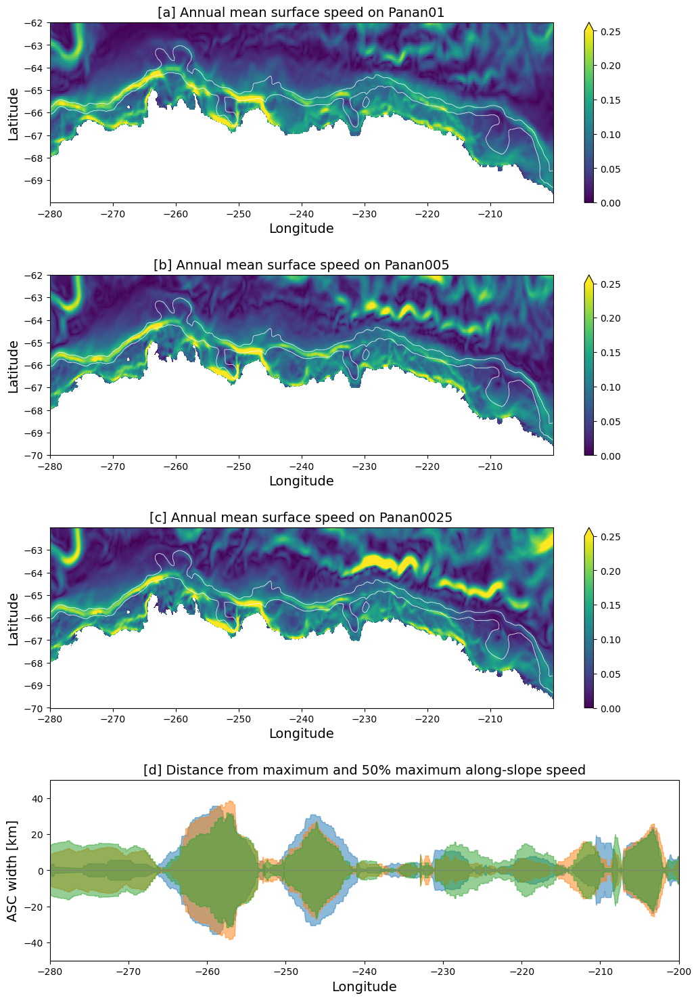

In [496]:
plt.figure(figsize=(12,18))
plt.subplots_adjust(hspace=0.4)

vmaxref2 = 0.25

plt.subplot(4,1,1)
Speed_01.sel(xq=R1_lon_slice,yq=R1_lat_slice).plot(vmin=0,vmax=vmaxref2)
Panan005_isobaths.sel(xq=R1_lon_slice,yq=R1_lat_slice).Mask.fillna(0)\
    .plot.contour(levels=[0,],colors='w',linewidths=0.5)
plt.xlabel('Longitude',fontsize=14)
plt.ylabel('Latitude',fontsize=14)
plt.title('[a] Annual mean surface speed on Panan01',fontsize=14)



plt.subplot(4,1,2)
Speed_005.sel(xq=R1_lon_slice,yq=R1_lat_slice).plot(vmin=0,vmax=vmaxref2)
Panan005_isobaths.sel(xq=R1_lon_slice,yq=R1_lat_slice).Mask.fillna(0)\
    .plot.contour(levels=[0,],colors='w',linewidths=0.5)
plt.xlabel('Longitude',fontsize=14)
plt.ylabel('Latitude',fontsize=14)
plt.title('[b] Annual mean surface speed on Panan005',fontsize=14)

plt.subplot(4,1,3)
Speed_0025.sel(xq=R1_lon_slice,yq=R1_lat_slice).plot(vmin=0,vmax=vmaxref2)
Panan005_isobaths.sel(xq=R1_lon_slice,yq=R1_lat_slice).Mask.fillna(0)\
    .plot.contour(levels=[0,],colors='w',linewidths=0.5)
plt.xlabel('Longitude',fontsize=14)
plt.ylabel('Latitude',fontsize=14)
plt.title('[c] Annual mean surface speed on Panan0025',fontsize=14)

plt.subplot(4,1,4)
plt.plot(P01_alongiso_speed_tmean_50ymax_rmean_dist_lon.xq,P01_alongiso_speed_tmean_50ymax_rmean_dist_lon*0,color='grey',linewidth=0.5)
plt.fill_between(x = P01_alongiso_speed_tmean_50ymax_rmean_dist_lon.xq,\
                 y1 = P01_alongiso_speed_tmean_50ymax_rmean_dist_lon.isel(z_l=0),\
                 y2 = -P01_alongiso_speed_tmean_50ymax_rmean_dist_lon.isel(z_l=0),color='tab:blue',alpha=0.5)
plt.fill_between(x = P005_alongiso_speed_tmean_50ymax_rmean_dist_lon.xq,\
                 y1 = P005_alongiso_speed_tmean_50ymax_rmean_dist_lon.isel(z_l=0),\
                 y2 = -P005_alongiso_speed_tmean_50ymax_rmean_dist_lon.isel(z_l=0),color='tab:orange',alpha=0.5)
plt.fill_between(x = P0025_alongiso_speed_tmean_50ymax_rmean_dist_lon.xq,\
                 y1 = P0025_alongiso_speed_tmean_50ymax_rmean_dist_lon.isel(z_l=0),\
                 y2 = -P0025_alongiso_speed_tmean_50ymax_rmean_dist_lon.isel(z_l=0),color='tab:green',alpha=0.5)


plt.xlabel('Longitude',fontsize=14)
plt.ylabel('ASC width [km]',fontsize=14)
plt.xlim(-280,-200)
plt.ylim(-50,50)
plt.title('[d] Distance from maximum and 50% maximum along-slope speed',fontsize=14)


plt.savefig(figdir +'ASCsurf_speeds_WestofRoss.png',dpi=300,bbox_inches='tight')

It looks like there is a bit of narrowing, mostly on the 1/40th. Check for example west of -260, and between -240 and -230. 

What about water column integrated speeds?

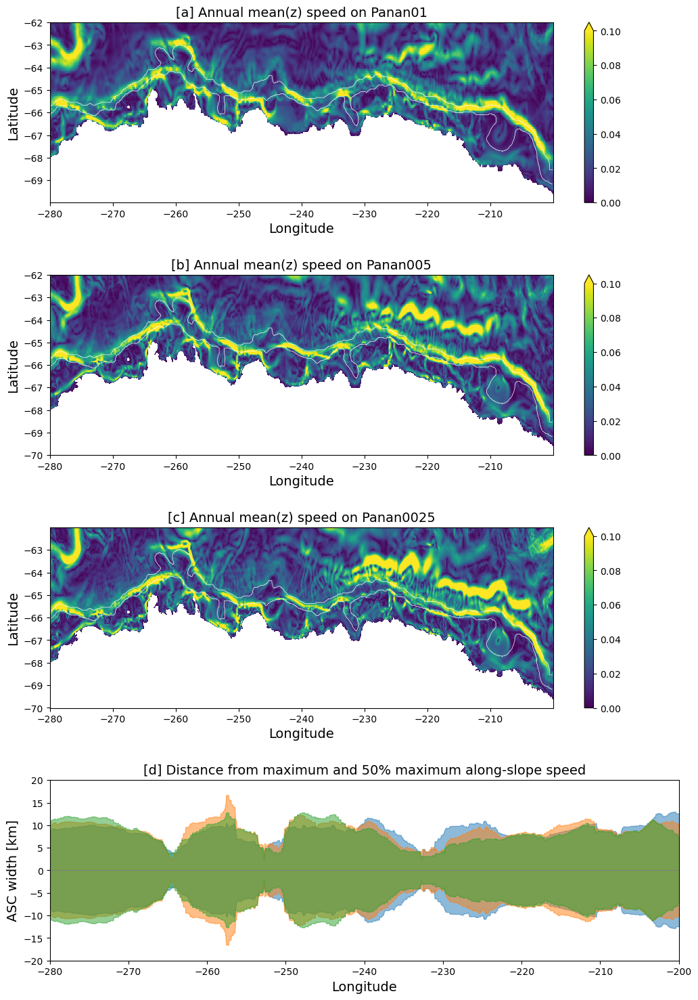

In [497]:
plt.figure(figsize=(12,18))
plt.subplots_adjust(hspace=0.4)

vmaxref_FD = 0.1

plt.subplot(4,1,1)
Speed_01_FD.sel(xq=R1_lon_slice,yq=R1_lat_slice).plot(vmin=0,vmax=vmaxref_FD)
Panan01_isobaths.sel(xq=R1_lon_slice,yq=R1_lat_slice).Mask.fillna(0)\
    .plot.contour(levels=[0,],colors='w',linewidths=0.5)
plt.xlabel('Longitude',fontsize=14)
plt.ylabel('Latitude',fontsize=14)
plt.title('[a] Annual mean(z) speed on Panan01',fontsize=14)



plt.subplot(4,1,2)
Speed_005_FD.sel(xq=R1_lon_slice,yq=R1_lat_slice).plot(vmin=0,vmax=vmaxref_FD)
Panan01_isobaths.sel(xq=R1_lon_slice,yq=R1_lat_slice).Mask.fillna(0)\
    .plot.contour(levels=[0,],colors='w',linewidths=0.5)
plt.xlabel('Longitude',fontsize=14)
plt.ylabel('Latitude',fontsize=14)
plt.title('[b] Annual mean(z) speed on Panan005',fontsize=14)

plt.subplot(4,1,3)
Speed_0025_FD.sel(xq=R1_lon_slice,yq=R1_lat_slice).plot(vmin=0,vmax=vmaxref_FD)
Panan01_isobaths.sel(xq=R1_lon_slice,yq=R1_lat_slice).Mask.fillna(0)\
    .plot.contour(levels=[0,],colors='w',linewidths=0.5)
plt.xlabel('Longitude',fontsize=14)
plt.ylabel('Latitude',fontsize=14)
plt.title('[c] Annual mean(z) speed on Panan0025',fontsize=14)

plt.subplot(4,1,4)
plt.plot(P01_alongiso_speed_tmean_50ymax_rmean_dist_lon.xq,P01_alongiso_speed_tmean_50ymax_rmean_dist_lon*0,color='grey',linewidth=0.5)
plt.fill_between(x = P01_alongiso_speed_tmean_50ymax_rmean_dist_lon.xq,\
                 y1 = P01_alongiso_speed_tmean_50ymax_rmean_dist_lon.weighted(dzt).mean('z_l'),\
                 y2 = -P01_alongiso_speed_tmean_50ymax_rmean_dist_lon.weighted(dzt).mean('z_l'),color='tab:blue',alpha=0.5)
plt.fill_between(x = P005_alongiso_speed_tmean_50ymax_rmean_dist_lon.xq,\
                 y1 = P005_alongiso_speed_tmean_50ymax_rmean_dist_lon.weighted(dzt).mean('z_l'),\
                 y2 = -P005_alongiso_speed_tmean_50ymax_rmean_dist_lon.weighted(dzt).mean('z_l'),color='tab:orange',alpha=0.5)
plt.fill_between(x = P0025_alongiso_speed_tmean_50ymax_rmean_dist_lon.xq,\
                 y1 = P0025_alongiso_speed_tmean_50ymax_rmean_dist_lon.weighted(dzt).mean('z_l'),\
                 y2 = -P0025_alongiso_speed_tmean_50ymax_rmean_dist_lon.weighted(dzt).mean('z_l'),color='tab:green',alpha=0.5)


plt.xlabel('Longitude',fontsize=14)
plt.ylabel('ASC width [km]',fontsize=14)
plt.xlim(-280,-200)
plt.ylim(-20,20)
plt.title('[d] Distance from maximum and 50% maximum along-slope speed',fontsize=14)

plt.savefig(figdir +'ASCmeanz_speeds_WestofRoss.png',dpi=300,bbox_inches='tight')

It looks a bit less fragmented on higher resolutions

### Region 2, Ross Sea

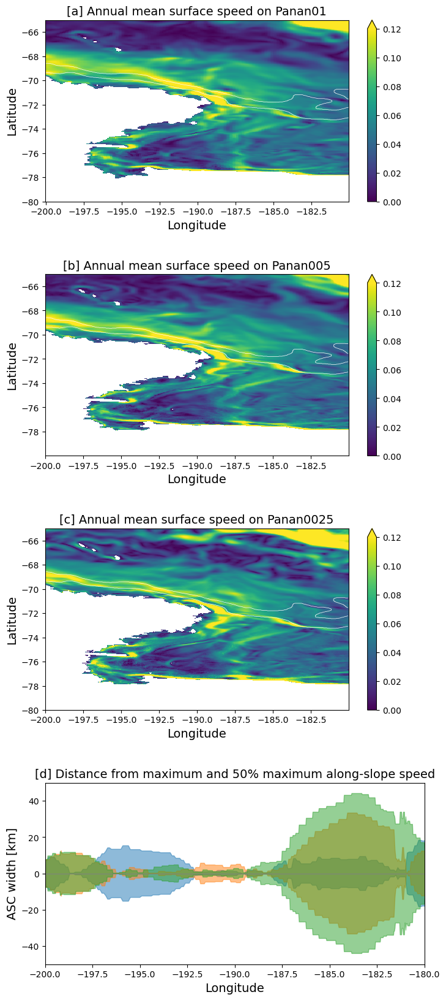

In [498]:
plt.figure(figsize=(8,20))
plt.subplots_adjust(hspace=0.4)

vmaxref2 = 0.12

plt.subplot(4,1,1)
Speed_01.sel(xq=R2_lon_slice,yq=R2_lat_slice).plot(vmin=0,vmax=vmaxref2)
Panan005_isobaths.sel(xq=R2_lon_slice,yq=R2_lat_slice).Mask.fillna(0)\
    .plot.contour(levels=[0,],colors='w',linewidths=0.5)
plt.xlabel('Longitude',fontsize=14)
plt.ylabel('Latitude',fontsize=14)
plt.title('[a] Annual mean surface speed on Panan01',fontsize=14)



plt.subplot(4,1,2)
Speed_005.sel(xq=R2_lon_slice,yq=R2_lat_slice).plot(vmin=0,vmax=vmaxref2)
Panan005_isobaths.sel(xq=R2_lon_slice,yq=R2_lat_slice).Mask.fillna(0)\
    .plot.contour(levels=[0,],colors='w',linewidths=0.5)
plt.xlabel('Longitude',fontsize=14)
plt.ylabel('Latitude',fontsize=14)
plt.title('[b] Annual mean surface speed on Panan005',fontsize=14)

plt.subplot(4,1,3)
Speed_0025.sel(xq=R2_lon_slice,yq=R2_lat_slice).plot(vmin=0,vmax=vmaxref2)
Panan005_isobaths.sel(xq=R2_lon_slice,yq=R2_lat_slice).Mask.fillna(0)\
    .plot.contour(levels=[0,],colors='w',linewidths=0.5)
plt.xlabel('Longitude',fontsize=14)
plt.ylabel('Latitude',fontsize=14)
plt.title('[c] Annual mean surface speed on Panan0025',fontsize=14)

plt.subplot(4,1,4)
plt.plot(P01_alongiso_speed_tmean_50ymax_rmean_dist_lon.xq,P01_alongiso_speed_tmean_50ymax_rmean_dist_lon*0,color='grey',linewidth=0.5)
plt.fill_between(x = P01_alongiso_speed_tmean_50ymax_rmean_dist_lon.xq,\
                 y1 = P01_alongiso_speed_tmean_50ymax_rmean_dist_lon.isel(z_l=0),\
                 y2 = -P01_alongiso_speed_tmean_50ymax_rmean_dist_lon.isel(z_l=0),color='tab:blue',alpha=0.5)
plt.fill_between(x = P005_alongiso_speed_tmean_50ymax_rmean_dist_lon.xq,\
                 y1 = P005_alongiso_speed_tmean_50ymax_rmean_dist_lon.isel(z_l=0),\
                 y2 = -P005_alongiso_speed_tmean_50ymax_rmean_dist_lon.isel(z_l=0),color='tab:orange',alpha=0.5)
plt.fill_between(x = P0025_alongiso_speed_tmean_50ymax_rmean_dist_lon.xq,\
                 y1 = P0025_alongiso_speed_tmean_50ymax_rmean_dist_lon.isel(z_l=0),\
                 y2 = -P0025_alongiso_speed_tmean_50ymax_rmean_dist_lon.isel(z_l=0),color='tab:green',alpha=0.5)


plt.xlabel('Longitude',fontsize=14)
plt.ylabel('ASC width [km]',fontsize=14)
plt.xlim(-200,-180)
plt.ylim(-50,50)
plt.title('[d] Distance from maximum and 50% maximum along-slope speed',fontsize=14)

plt.savefig(figdir +'ASCsurf_speeds_Ross.png',dpi=300,bbox_inches='tight')

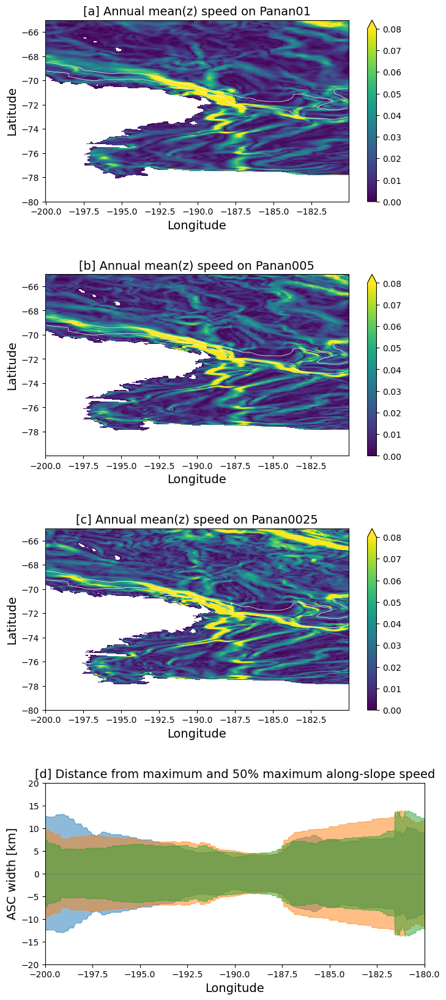

In [499]:
plt.figure(figsize=(8,20))
plt.subplots_adjust(hspace=0.4)

vmaxref_FD = 0.08

plt.subplot(4,1,1)
Speed_01_FD.sel(xq=R2_lon_slice,yq=R2_lat_slice).plot(vmin=0,vmax=vmaxref_FD)
Panan01_isobaths.sel(xq=R2_lon_slice,yq=R2_lat_slice).Mask.fillna(0)\
    .plot.contour(levels=[0,],colors='w',linewidths=0.5)
plt.xlabel('Longitude',fontsize=14)
plt.ylabel('Latitude',fontsize=14)
plt.title('[a] Annual mean(z) speed on Panan01',fontsize=14)



plt.subplot(4,1,2)
Speed_005_FD.sel(xq=R2_lon_slice,yq=R2_lat_slice).plot(vmin=0,vmax=vmaxref_FD)
Panan01_isobaths.sel(xq=R2_lon_slice,yq=R2_lat_slice).Mask.fillna(0)\
    .plot.contour(levels=[0,],colors='w',linewidths=0.5)
plt.xlabel('Longitude',fontsize=14)
plt.ylabel('Latitude',fontsize=14)
plt.title('[b] Annual mean(z) speed on Panan005',fontsize=14)

plt.subplot(4,1,3)
Speed_0025_FD.sel(xq=R2_lon_slice,yq=R2_lat_slice).plot(vmin=0,vmax=vmaxref_FD)
Panan01_isobaths.sel(xq=R2_lon_slice,yq=R2_lat_slice).Mask.fillna(0)\
    .plot.contour(levels=[0,],colors='w',linewidths=0.5)
plt.xlabel('Longitude',fontsize=14)
plt.ylabel('Latitude',fontsize=14)
plt.title('[c] Annual mean(z) speed on Panan0025',fontsize=14)

plt.subplot(4,1,4)
plt.plot(P01_alongiso_speed_tmean_50ymax_rmean_dist_lon.xq,P01_alongiso_speed_tmean_50ymax_rmean_dist_lon*0,color='grey',linewidth=0.5)
plt.fill_between(x = P01_alongiso_speed_tmean_50ymax_rmean_dist_lon.xq,\
                 y1 = P01_alongiso_speed_tmean_50ymax_rmean_dist_lon.weighted(dzt).mean('z_l'),\
                 y2 = -P01_alongiso_speed_tmean_50ymax_rmean_dist_lon.weighted(dzt).mean('z_l'),color='tab:blue',alpha=0.5)
plt.fill_between(x = P005_alongiso_speed_tmean_50ymax_rmean_dist_lon.xq,\
                 y1 = P005_alongiso_speed_tmean_50ymax_rmean_dist_lon.weighted(dzt).mean('z_l'),\
                 y2 = -P005_alongiso_speed_tmean_50ymax_rmean_dist_lon.weighted(dzt).mean('z_l'),color='tab:orange',alpha=0.5)
plt.fill_between(x = P0025_alongiso_speed_tmean_50ymax_rmean_dist_lon.xq,\
                 y1 = P0025_alongiso_speed_tmean_50ymax_rmean_dist_lon.weighted(dzt).mean('z_l'),\
                 y2 = -P0025_alongiso_speed_tmean_50ymax_rmean_dist_lon.weighted(dzt).mean('z_l'),color='tab:green',alpha=0.5)


plt.xlabel('Longitude',fontsize=14)
plt.ylabel('ASC width [km]',fontsize=14)
plt.xlim(-200,-180)
plt.ylim(-20,20)
plt.title('[d] Distance from maximum and 50% maximum along-slope speed',fontsize=14)

plt.savefig(figdir +'ASCmeanz_speeds_Ross.png',dpi=300,bbox_inches='tight')

A little more of a coherent narrowing here here

### Region 4, Antarctic peninsula

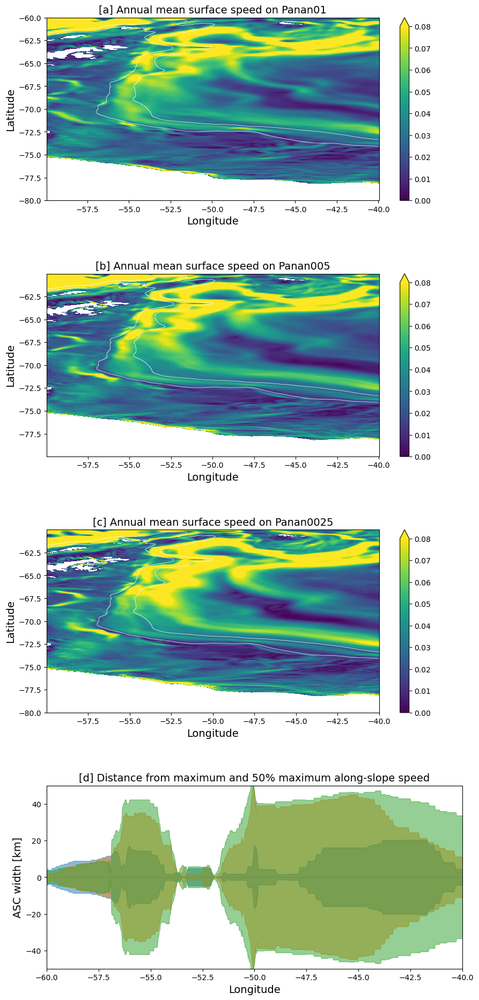

In [500]:
plt.figure(figsize=(10,23))
plt.subplots_adjust(hspace=0.4)

vmaxref2 = 0.08

plt.subplot(4,1,1)
Speed_01.sel(xq=R4_lon_slice,yq=R4_lat_slice).plot(vmin=0,vmax=vmaxref2)
Panan005_isobaths.sel(xq=R4_lon_slice,yq=R4_lat_slice).Mask.fillna(0)\
    .plot.contour(levels=[0,],colors='w',linewidths=0.5)
plt.xlabel('Longitude',fontsize=14)
plt.ylabel('Latitude',fontsize=14)
plt.title('[a] Annual mean surface speed on Panan01',fontsize=14)



plt.subplot(4,1,2)
Speed_005.sel(xq=R4_lon_slice,yq=R4_lat_slice).plot(vmin=0,vmax=vmaxref2)
Panan005_isobaths.sel(xq=R4_lon_slice,yq=R4_lat_slice).Mask.fillna(0)\
    .plot.contour(levels=[0,],colors='w',linewidths=0.5)
plt.xlabel('Longitude',fontsize=14)
plt.ylabel('Latitude',fontsize=14)
plt.title('[b] Annual mean surface speed on Panan005',fontsize=14)

plt.subplot(4,1,3)
Speed_0025.sel(xq=R4_lon_slice,yq=R4_lat_slice).plot(vmin=0,vmax=vmaxref2)
Panan005_isobaths.sel(xq=R4_lon_slice,yq=R4_lat_slice).Mask.fillna(0)\
    .plot.contour(levels=[0,],colors='w',linewidths=0.5)
plt.xlabel('Longitude',fontsize=14)
plt.ylabel('Latitude',fontsize=14)
plt.title('[c] Annual mean surface speed on Panan0025',fontsize=14)

plt.subplot(4,1,4)
plt.plot(P01_alongiso_speed_tmean_50ymax_rmean_dist_lon.xq,P01_alongiso_speed_tmean_50ymax_rmean_dist_lon*0,color='grey',linewidth=0.5)
plt.fill_between(x = P01_alongiso_speed_tmean_50ymax_rmean_dist_lon.xq,\
                 y1 = P01_alongiso_speed_tmean_50ymax_rmean_dist_lon.isel(z_l=0),\
                 y2 = -P01_alongiso_speed_tmean_50ymax_rmean_dist_lon.isel(z_l=0),color='tab:blue',alpha=0.5)
plt.fill_between(x = P005_alongiso_speed_tmean_50ymax_rmean_dist_lon.xq,\
                 y1 = P005_alongiso_speed_tmean_50ymax_rmean_dist_lon.isel(z_l=0),\
                 y2 = -P005_alongiso_speed_tmean_50ymax_rmean_dist_lon.isel(z_l=0),color='tab:orange',alpha=0.5)
plt.fill_between(x = P0025_alongiso_speed_tmean_50ymax_rmean_dist_lon.xq,\
                 y1 = P0025_alongiso_speed_tmean_50ymax_rmean_dist_lon.isel(z_l=0),\
                 y2 = -P0025_alongiso_speed_tmean_50ymax_rmean_dist_lon.isel(z_l=0),color='tab:green',alpha=0.5)


plt.xlabel('Longitude',fontsize=14)
plt.ylabel('ASC width [km]',fontsize=14)
plt.xlim(-60,-40)
plt.ylim(-50,50)
plt.title('[d] Distance from maximum and 50% maximum along-slope speed',fontsize=14)


plt.savefig(figdir +'ASCsurf_speeds_Weddell.png',dpi=300,bbox_inches='tight')

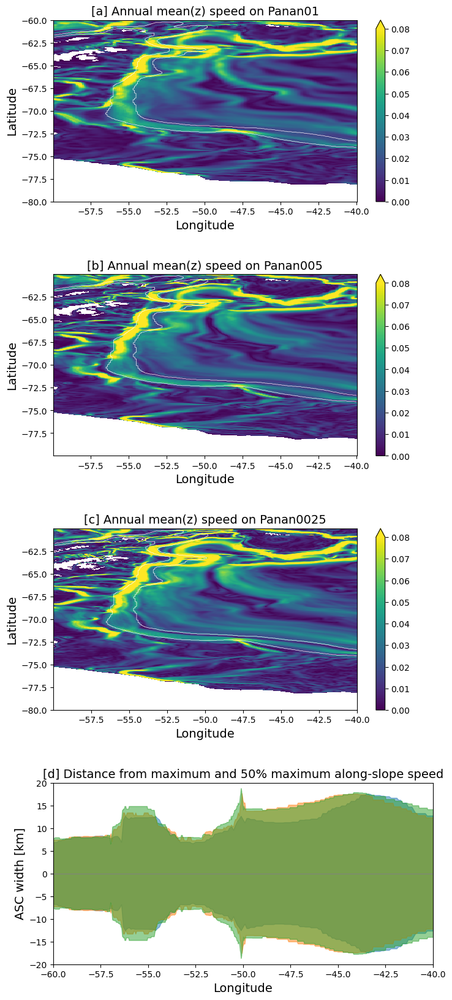

In [501]:
plt.figure(figsize=(8,20))
plt.subplots_adjust(hspace=0.4)

vmaxref_FD = 0.08

plt.subplot(4,1,1)
Speed_01_FD.sel(xq=R4_lon_slice,yq=R4_lat_slice).plot(vmin=0,vmax=vmaxref_FD)
Panan01_isobaths.sel(xq=R4_lon_slice,yq=R4_lat_slice).Mask.fillna(0)\
    .plot.contour(levels=[0,],colors='w',linewidths=0.5)
plt.xlabel('Longitude',fontsize=14)
plt.ylabel('Latitude',fontsize=14)
plt.title('[a] Annual mean(z) speed on Panan01',fontsize=14)



plt.subplot(4,1,2)
Speed_005_FD.sel(xq=R4_lon_slice,yq=R4_lat_slice).plot(vmin=0,vmax=vmaxref_FD)
Panan01_isobaths.sel(xq=R4_lon_slice,yq=R4_lat_slice).Mask.fillna(0)\
    .plot.contour(levels=[0,],colors='w',linewidths=0.5)
plt.xlabel('Longitude',fontsize=14)
plt.ylabel('Latitude',fontsize=14)
plt.title('[b] Annual mean(z) speed on Panan005',fontsize=14)

plt.subplot(4,1,3)
Speed_0025_FD.sel(xq=R4_lon_slice,yq=R4_lat_slice).plot(vmin=0,vmax=vmaxref_FD)
Panan01_isobaths.sel(xq=R4_lon_slice,yq=R4_lat_slice).Mask.fillna(0)\
    .plot.contour(levels=[0,],colors='w',linewidths=0.5)
plt.xlabel('Longitude',fontsize=14)
plt.ylabel('Latitude',fontsize=14)
plt.title('[c] Annual mean(z) speed on Panan0025',fontsize=14)

plt.subplot(4,1,4)
plt.plot(P01_alongiso_speed_tmean_50ymax_rmean_dist_lon.xq,P01_alongiso_speed_tmean_50ymax_rmean_dist_lon*0,color='grey',linewidth=0.5)
plt.fill_between(x = P01_alongiso_speed_tmean_50ymax_rmean_dist_lon.xq,\
                 y1 = P01_alongiso_speed_tmean_50ymax_rmean_dist_lon.weighted(dzt).mean('z_l'),\
                 y2 = -P01_alongiso_speed_tmean_50ymax_rmean_dist_lon.weighted(dzt).mean('z_l'),color='tab:blue',alpha=0.5)
plt.fill_between(x = P005_alongiso_speed_tmean_50ymax_rmean_dist_lon.xq,\
                 y1 = P005_alongiso_speed_tmean_50ymax_rmean_dist_lon.weighted(dzt).mean('z_l'),\
                 y2 = -P005_alongiso_speed_tmean_50ymax_rmean_dist_lon.weighted(dzt).mean('z_l'),color='tab:orange',alpha=0.5)
plt.fill_between(x = P0025_alongiso_speed_tmean_50ymax_rmean_dist_lon.xq,\
                 y1 = P0025_alongiso_speed_tmean_50ymax_rmean_dist_lon.weighted(dzt).mean('z_l'),\
                 y2 = -P0025_alongiso_speed_tmean_50ymax_rmean_dist_lon.weighted(dzt).mean('z_l'),color='tab:green',alpha=0.5)


plt.xlabel('Longitude',fontsize=14)
plt.ylabel('ASC width [km]',fontsize=14)
plt.xlim(-60,-40)
plt.ylim(-20,20)
plt.title('[d] Distance from maximum and 50% maximum along-slope speed',fontsize=14)


plt.savefig(figdir +'ASCsmeanz_speeds_Weddell.png',dpi=300,bbox_inches='tight')


### Region 5, Weddell to Prydz

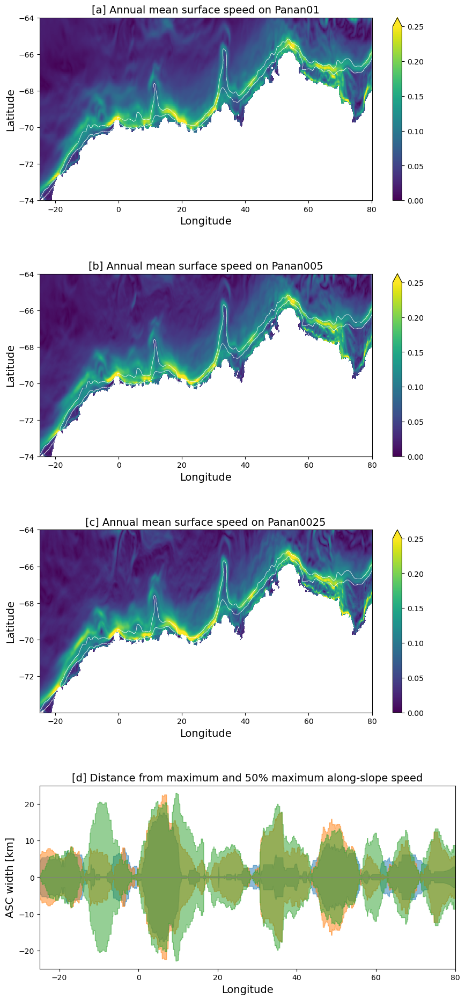

In [502]:
plt.figure(figsize=(10,23))
plt.subplots_adjust(hspace=0.4)

vmaxref2 = 0.25

plt.subplot(4,1,1)
Speed_01.sel(xq=R5_lon_slice,yq=R5_lat_slice).plot(vmin=0,vmax=vmaxref2)
Panan005_isobaths.sel(xq=R5_lon_slice,yq=R5_lat_slice).Mask.fillna(0)\
    .plot.contour(levels=[0,],colors='w',linewidths=0.5)
plt.xlabel('Longitude',fontsize=14)
plt.ylabel('Latitude',fontsize=14)
plt.title('[a] Annual mean surface speed on Panan01',fontsize=14)



plt.subplot(4,1,2)
Speed_005.sel(xq=R5_lon_slice,yq=R5_lat_slice).plot(vmin=0,vmax=vmaxref2)
Panan005_isobaths.sel(xq=R5_lon_slice,yq=R5_lat_slice).Mask.fillna(0)\
    .plot.contour(levels=[0,],colors='w',linewidths=0.5)
plt.xlabel('Longitude',fontsize=14)
plt.ylabel('Latitude',fontsize=14)
plt.title('[b] Annual mean surface speed on Panan005',fontsize=14)

plt.subplot(4,1,3)
Speed_0025.sel(xq=R5_lon_slice,yq=R5_lat_slice).plot(vmin=0,vmax=vmaxref2)
Panan005_isobaths.sel(xq=R5_lon_slice,yq=R5_lat_slice).Mask.fillna(0)\
    .plot.contour(levels=[0,],colors='w',linewidths=0.5)
plt.xlabel('Longitude',fontsize=14)
plt.ylabel('Latitude',fontsize=14)
plt.title('[c] Annual mean surface speed on Panan0025',fontsize=14)

plt.subplot(4,1,4)
plt.plot(P01_alongiso_speed_tmean_50ymax_rmean_dist_lon.xq,P01_alongiso_speed_tmean_50ymax_rmean_dist_lon*0,color='grey',linewidth=0.5)
plt.fill_between(x = P01_alongiso_speed_tmean_50ymax_rmean_dist_lon.xq,\
                 y1 = P01_alongiso_speed_tmean_50ymax_rmean_dist_lon.isel(z_l=0),\
                 y2 = -P01_alongiso_speed_tmean_50ymax_rmean_dist_lon.isel(z_l=0),color='tab:blue',alpha=0.5)
plt.fill_between(x = P005_alongiso_speed_tmean_50ymax_rmean_dist_lon.xq,\
                 y1 = P005_alongiso_speed_tmean_50ymax_rmean_dist_lon.isel(z_l=0),\
                 y2 = -P005_alongiso_speed_tmean_50ymax_rmean_dist_lon.isel(z_l=0),color='tab:orange',alpha=0.5)
plt.fill_between(x = P0025_alongiso_speed_tmean_50ymax_rmean_dist_lon.xq,\
                 y1 = P0025_alongiso_speed_tmean_50ymax_rmean_dist_lon.isel(z_l=0),\
                 y2 = -P0025_alongiso_speed_tmean_50ymax_rmean_dist_lon.isel(z_l=0),color='tab:green',alpha=0.5)


plt.xlabel('Longitude',fontsize=14)
plt.ylabel('ASC width [km]',fontsize=14)
plt.xlim(-25,80)
plt.ylim(-25,25)
plt.title('[d] Distance from maximum and 50% maximum along-slope speed',fontsize=14)

plt.savefig(figdir +'ASCsurf_speeds_WtoPrydz.png',dpi=300,bbox_inches='tight')


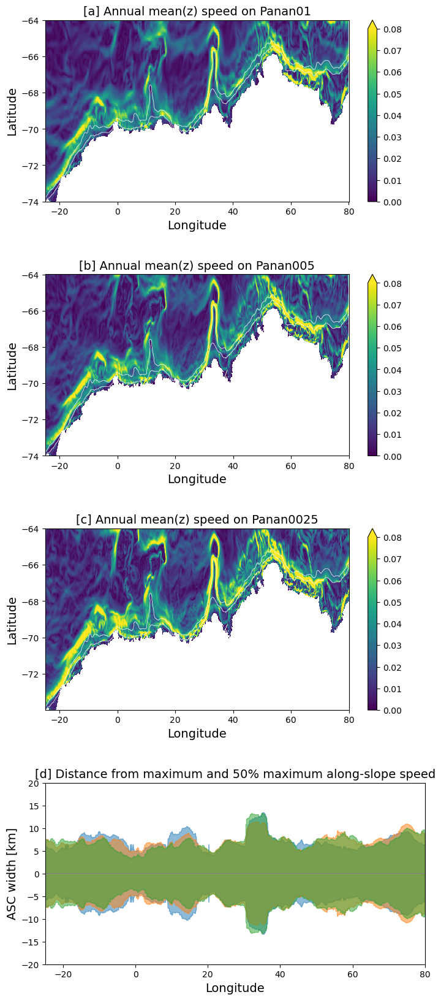

In [503]:
plt.figure(figsize=(8,20))
plt.subplots_adjust(hspace=0.4)

vmaxref_FD = 0.08

plt.subplot(4,1,1)
Speed_01_FD.sel(xq=R5_lon_slice,yq=R5_lat_slice).plot(vmin=0,vmax=vmaxref_FD)
Panan01_isobaths.sel(xq=R5_lon_slice,yq=R5_lat_slice).Mask.fillna(0)\
    .plot.contour(levels=[0,],colors='w',linewidths=0.5)
plt.xlabel('Longitude',fontsize=14)
plt.ylabel('Latitude',fontsize=14)
plt.title('[a] Annual mean(z) speed on Panan01',fontsize=14)



plt.subplot(4,1,2)
Speed_005_FD.sel(xq=R5_lon_slice,yq=R5_lat_slice).plot(vmin=0,vmax=vmaxref_FD)
Panan01_isobaths.sel(xq=R5_lon_slice,yq=R5_lat_slice).Mask.fillna(0)\
    .plot.contour(levels=[0,],colors='w',linewidths=0.5)
plt.xlabel('Longitude',fontsize=14)
plt.ylabel('Latitude',fontsize=14)
plt.title('[b] Annual mean(z) speed on Panan005',fontsize=14)

plt.subplot(4,1,3)
Speed_0025_FD.sel(xq=R5_lon_slice,yq=R5_lat_slice).plot(vmin=0,vmax=vmaxref_FD)
Panan01_isobaths.sel(xq=R5_lon_slice,yq=R5_lat_slice).Mask.fillna(0)\
    .plot.contour(levels=[0,],colors='w',linewidths=0.5)
plt.xlabel('Longitude',fontsize=14)
plt.ylabel('Latitude',fontsize=14)
plt.title('[c] Annual mean(z) speed on Panan0025',fontsize=14)

plt.subplot(4,1,4)
plt.plot(P01_alongiso_speed_tmean_50ymax_rmean_dist_lon.xq,P01_alongiso_speed_tmean_50ymax_rmean_dist_lon*0,color='grey',linewidth=0.5)
plt.fill_between(x = P01_alongiso_speed_tmean_50ymax_rmean_dist_lon.xq,\
                 y1 = P01_alongiso_speed_tmean_50ymax_rmean_dist_lon.weighted(dzt).mean('z_l'),\
                 y2 = -P01_alongiso_speed_tmean_50ymax_rmean_dist_lon.weighted(dzt).mean('z_l'),color='tab:blue',alpha=0.5)
plt.fill_between(x = P005_alongiso_speed_tmean_50ymax_rmean_dist_lon.xq,\
                 y1 = P005_alongiso_speed_tmean_50ymax_rmean_dist_lon.weighted(dzt).mean('z_l'),\
                 y2 = -P005_alongiso_speed_tmean_50ymax_rmean_dist_lon.weighted(dzt).mean('z_l'),color='tab:orange',alpha=0.5)
plt.fill_between(x = P0025_alongiso_speed_tmean_50ymax_rmean_dist_lon.xq,\
                 y1 = P0025_alongiso_speed_tmean_50ymax_rmean_dist_lon.weighted(dzt).mean('z_l'),\
                 y2 = -P0025_alongiso_speed_tmean_50ymax_rmean_dist_lon.weighted(dzt).mean('z_l'),color='tab:green',alpha=0.5)


plt.xlabel('Longitude',fontsize=14)
plt.ylabel('ASC width [km]',fontsize=14)
plt.xlim(-25,80)
plt.ylim(-20,20)
plt.title('[d] Distance from maximum and 50% maximum along-slope speed',fontsize=14)

plt.savefig(figdir +'ASCsmeanz_speeds_WtoPrydz.png',dpi=300,bbox_inches='tight')

In [480]:
P01_mean_y = P01_alongiso_speed_tmean_50ymax.mean(('x_bin','z_l'))
P01_dy = P01_alongiso_speed_tmean_50ymax_rmean_dist_lon.weighted(dzt).mean('z_l').mean('xq')

P005_mean_y = P005_alongiso_speed_tmean_50ymax.mean(('x_bin','z_l'))
P005_dy = P005_alongiso_speed_tmean_50ymax_rmean_dist_lon.weighted(dzt).mean('z_l').mean('xq')

P0025_mean_y = P0025_alongiso_speed_tmean_50ymax.mean(('x_bin','z_l'))
P0025_dy = P0025_alongiso_speed_tmean_50ymax_rmean_dist_lon.weighted(dzt).mean('z_l').mean('xq')

(-1.0, 1.0)

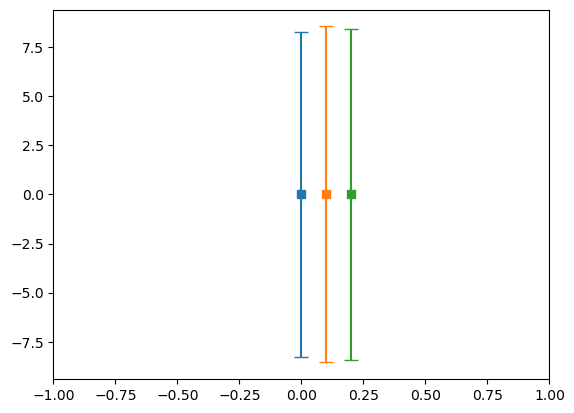

In [495]:
plt.figure()

plt.errorbar(0, 0, yerr=P01_dy , fmt='s', capsize=5, label=r'$0.1^o$',color='tab:blue')
plt.errorbar(.1, 0, yerr=P005_dy , fmt='s', capsize=5, label=r'$0.05^o$',color='tab:orange')
plt.errorbar(.2, 0, yerr=P0025_dy , fmt='s', capsize=5, label=r'$0.025^o$',color='tab:green')
plt.xlim(-1,1)

In [ ]:
##

Text(0.5, 1.0, '[c] Panan0025-Panan01')

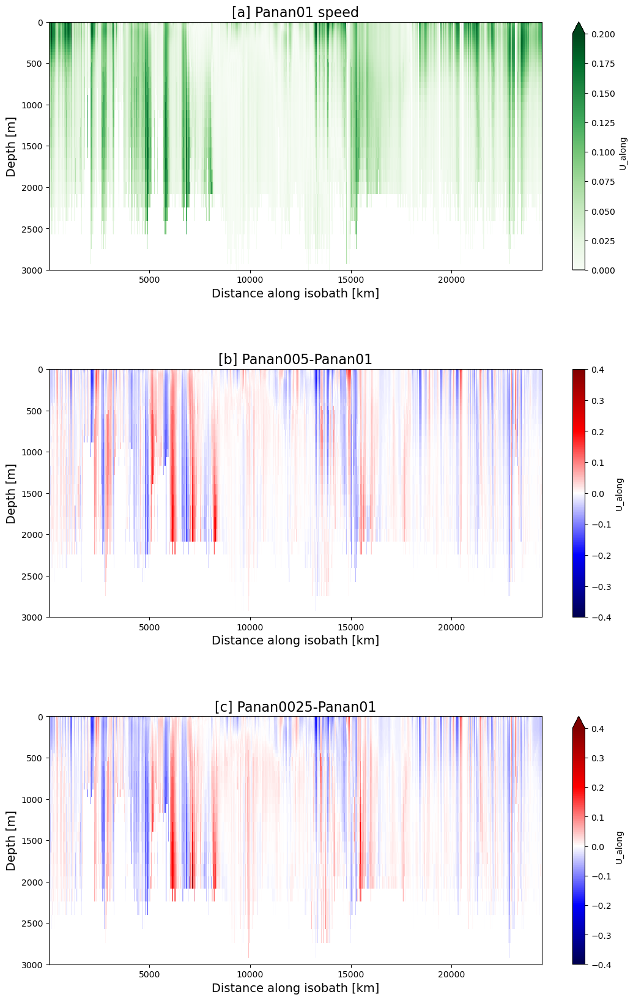

In [515]:
# plot

plt.figure(figsize=(13,20))
plt.subplots_adjust(hspace=0.4)


# #panan01
ax1 = plt.subplot(3,1,1)
mean_fz_01_rm = (P01_ASC_ymean_st.mean('time')**2)**0.5
mean_fz_01_rm .plot(x='x_bin',vmin=0,vmax=.2,cmap='Greens')
plt.ylim(3000,0)
plt.xlabel('Distance along isobath [km]',fontsize=14)
plt.ylabel('Depth [m]',fontsize=14)
plt.title('[a] Panan01 speed',fontsize=16)

# #panan005-panan01
ax1 = plt.subplot(3,1,2)
mean_fz_005_rm = (P005_ASC_ymean_st.mean('time')**2)**0.5
(mean_fz_005_rm- mean_fz_01_rm) .plot(x='x_bin',vmin=-.4,vmax=.4,cmap='seismic')
plt.ylim(3000,0)
plt.xlabel('Distance along isobath [km]',fontsize=14)
plt.ylabel('Depth [m]',fontsize=14)
plt.title('[b] Panan005-Panan01',fontsize=16)


# #panan005-panan01
ax1 = plt.subplot(3,1,3)
mean_fz_0025_rm = (P0025_ASC_ymean_st.mean('time')**2)**0.5
(mean_fz_0025_rm- mean_fz_01_rm) .plot(x='x_bin',vmin=-.4,vmax=.4,cmap='seismic')
plt.ylim(3000,0)
plt.xlabel('Distance along isobath [km]',fontsize=14)
plt.ylabel('Depth [m]',fontsize=14)
plt.title('[c] Panan0025-Panan01',fontsize=16)
